## Applied Machine Learning:
    Assignment 02
    Sai Lakshmi Nikitha Akarapu
    SXA210112

Seoul Bike Sharing Demand:

Data Set Information:
Currently Rental bikes are introduced in many urban cities for the enhancement of mobility comfort. It is important to make the rental bike available and accessible to the public at the right time as it lessens the waiting time. Eventually, providing the city with a stable supply of rental bikes becomes a major concern. The crucial part is the prediction of bike count required at each hour for the stable supply of rental bikes.
The dataset contains weather information (Temperature, Humidity, Windspeed, Visibility, Dewpoint, Solar radiation, Snowfall, Rainfall), the number of bikes rented per hour and date information.


Attribute Information:
Date : year-month-day
Rented Bike count - Count of bikes rented at each hour
Hour - Hour of he day
Temperature-Temperature in Celsius
Humidity - %
Windspeed - m/s
Visibility - 10m
Dew point temperature - Celsius
Solar radiation - MJ/m2
Rainfall - mm
Snowfall - cm
Seasons - Winter, Spring, Summer, Autumn
Holiday - Holiday/No holiday
Functional Day - NoFunc(Non Functional Hours), Fun(Functional hours)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import time
import statistics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import svm
from sklearn import metrics
from sklearn.metrics import plot_confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import r2_score
from IPython.display import Image  
from sklearn import tree
from os import system
import os
import glob

## 1. Data Import:
Import the given datasets. Explore shape and size.

In [2]:
Dataset = pd.read_csv("SeoulBikeData.csv", encoding = 'unicode_escape')

In [3]:
Dataset.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [4]:
Dataset.shape

(8760, 14)

Number of rows and columns in the dataframe is 8760 and 14 respectively.

In [5]:
Dataset.size

122640

The size of dataframe is 122640 which is equivalent to total number of rows*columns

In [6]:
Dataset['Snowfall (cm)'].unique()

array([0. , 0.1, 0.3, 0.4, 0.2, 1. , 0.9, 0.8, 0.7, 0.6, 2.7, 4. , 4.1,
       4.3, 3.9, 3.1, 2.1, 1.4, 0.5, 1.3, 1.8, 2. , 4.8, 5.1, 5. , 4.2,
       3.2, 2.6, 2.5, 2.3, 2.2, 1.9, 1.7, 1.6, 2.4, 1.2, 1.1, 3. , 3.3,
       3.5, 3.4, 2.8, 1.5, 3.8, 3.7, 7.1, 8.8, 7. , 6. , 3.6, 2.9])

In [7]:
Dataset['Snowfall (cm)'].unique()

array([0. , 0.1, 0.3, 0.4, 0.2, 1. , 0.9, 0.8, 0.7, 0.6, 2.7, 4. , 4.1,
       4.3, 3.9, 3.1, 2.1, 1.4, 0.5, 1.3, 1.8, 2. , 4.8, 5.1, 5. , 4.2,
       3.2, 2.6, 2.5, 2.3, 2.2, 1.9, 1.7, 1.6, 2.4, 1.2, 1.1, 3. , 3.3,
       3.5, 3.4, 2.8, 1.5, 3.8, 3.7, 7.1, 8.8, 7. , 6. , 3.6, 2.9])

## 2. Data Preparation tasks:

Handling Missing values

Convert categorical variables to continuous using functional knowledge

And Drop attribute/s if required


In [8]:
# Explore data types
Dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

In [9]:
# Missing Values
Dataset.isnull().sum()

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64

From the above output, we can conclude that there are no missing values in the dataset.

In [10]:
Dataset.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000
25%,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000
50%,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000
75%,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000
max,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000


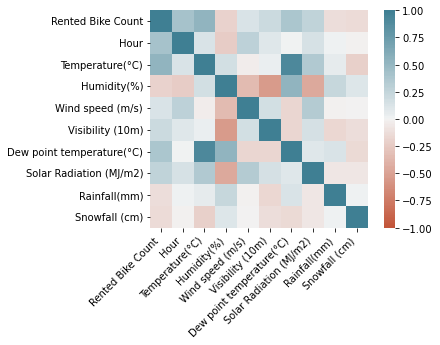

In [11]:
corr = Dataset.corr()
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

<AxesSubplot:xlabel='Date', ylabel='Dew point temperature(°C)'>

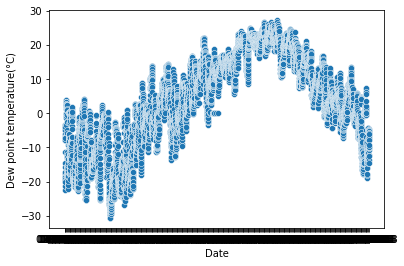

In [12]:
sns.scatterplot(x='Date', y='Dew point temperature(°C)', data=Dataset, palette='Blues_d')

<AxesSubplot:xlabel='Hour', ylabel='Rented Bike Count'>

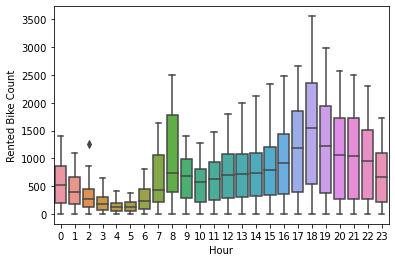

In [13]:
sns.boxplot(x = 'Hour', y = 'Rented Bike Count', data = Dataset)

## Data Cleaning:
Converting categories to dummies

In [14]:
# Automate categorical vs numerical variables separation
Summary=Dataset.describe().T
Conti=Summary.index
Column_name=Dataset.columns
All=[]
for i in range(len(Conti)):
    for j in range(len(Column_name)):
        if Conti[i]!=Column_name[j]:
            All.append(Column_name[j])
Categorical=list(set(All)-set(Conti))
Continuous=list(set(All)-set(Categorical))
print("Continuous Variables:",Continuous)
print("\nCategorical variables found in the dataset:\n",Categorical)

Continuous Variables: ['Rainfall(mm)', 'Visibility (10m)', 'Snowfall (cm)', 'Solar Radiation (MJ/m2)', 'Temperature(°C)', 'Hour', 'Rented Bike Count', 'Humidity(%)', 'Dew point temperature(°C)', 'Wind speed (m/s)']

Categorical variables found in the dataset:
 ['Holiday', 'Date', 'Functioning Day', 'Seasons']


In [15]:
pd.unique(Dataset.Seasons)

array(['Winter', 'Spring', 'Summer', 'Autumn'], dtype=object)

In [16]:
Dataset['Functioning Day'].unique()

array(['Yes', 'No'], dtype=object)

In [17]:
pd.unique(Dataset.Holiday)

array(['No Holiday', 'Holiday'], dtype=object)

Coverting date to year, month, day colums

In [18]:
import datetime
Dataset['Date'] = pd.to_datetime(Dataset['Date'], format='%d/%m/%Y').dt.strftime('%m/%d/%Y')
Dataset['Year'] = pd.DatetimeIndex(Dataset['Date']).year
Dataset['Month'] = pd.DatetimeIndex(Dataset['Date']).month
Dataset['Day'] = pd.DatetimeIndex(Dataset['Date']).day

In [19]:
Dataset.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Year,Month,Day
0,12/01/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,12,1
1,12/01/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,12,1
2,12/01/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,12,1
3,12/01/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,12,1
4,12/01/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,12,1


In [20]:
Dataset = Dataset.drop('Date',axis=1)

In [21]:
Dataset.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Year,Month,Day
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,12,1
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,12,1
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,12,1
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,12,1
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,12,1


Creating dummies for Seasons categorical variable

In [22]:
dummies = pd.get_dummies(Dataset.Seasons)
Dataset = pd.concat([Dataset, dummies], axis='columns')
Dataset = Dataset.drop(['Seasons', 'Winter'], axis='columns') 
Dataset.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Functioning Day,Year,Month,Day,Autumn,Spring,Summer
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,No Holiday,Yes,2017,12,1,0,0,0
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,No Holiday,Yes,2017,12,1,0,0,0
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,No Holiday,Yes,2017,12,1,0,0,0
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,No Holiday,Yes,2017,12,1,0,0,0
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,No Holiday,Yes,2017,12,1,0,0,0


In [23]:
dummies = pd.get_dummies(Dataset.Hour)
Dataset = pd.concat([Dataset, dummies], axis='columns')
Dataset = Dataset.drop(['Hour', 23], axis='columns') 
Dataset.rename(columns = {0:'Hour_0',1:'Hour_1',2:'Hour_2',3:'Hour_3',4:'Hour_4',5:'Hour_5',6:'Hour_6',7:'Hour_7',8:'Hour_8',9:'Hour_9',
                         10:'Hour_10',11:'Hour_11',12:'Hour_12',13:'Hour_13',14:'Hour_14',15:'Hour_15',
                         16:'Hour_16',17:'Hour_17',18:'Hour_18',19:'Hour_19',20:'Hour_20',21:'Hour_21',22:'Hour_22'}, inplace = True)
Dataset.head()

,Rented Bike Count,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,...,Hour_13,Hour_14,Hour_15,Hour_16,Hour_17,Hour_18,Hour_19,Hour_20,Hour_21,Hour_22
0,254,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,No Holiday,...,0,0,0,0,0,0,0,0,0,0
1,204,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,No Holiday,...,0,0,0,0,0,0,0,0,0,0
2,173,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,No Holiday,...,0,0,0,0,0,0,0,0,0,0
3,107,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,No Holiday,...,0,0,0,0,0,0,0,0,0,0
4,78,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,No Holiday,...,0,0,0,0,0,0,0,0,0,0


In [24]:
Dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 40 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Rented Bike Count          8760 non-null   int64  
 1   Temperature(°C)            8760 non-null   float64
 2   Humidity(%)                8760 non-null   int64  
 3   Wind speed (m/s)           8760 non-null   float64
 4   Visibility (10m)           8760 non-null   int64  
 5   Dew point temperature(°C)  8760 non-null   float64
 6   Solar Radiation (MJ/m2)    8760 non-null   float64
 7   Rainfall(mm)               8760 non-null   float64
 8   Snowfall (cm)              8760 non-null   float64
 9   Holiday                    8760 non-null   object 
 10  Functioning Day            8760 non-null   object 
 11  Year                       8760 non-null   int64  
 12  Month                      8760 non-null   int64  
 13  Day                        8760 non-null   int64

Converting Functioning Day and Holiday columns to binaries

In [25]:
Dataset['Functioning Day'] = Dataset['Functioning Day'].map(
                   {'Yes':1 ,'No':0})

In [26]:
Dataset['Holiday'] = Dataset['Holiday'].map(
                   {'Holiday':1 ,'No Holiday':0})

In [27]:
Dataset.head()

,Rented Bike Count,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,...,Hour_13,Hour_14,Hour_15,Hour_16,Hour_17,Hour_18,Hour_19,Hour_20,Hour_21,Hour_22
0,254,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
1,204,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
2,173,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
3,107,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
4,78,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,0,...,0,0,0,0,0,0,0,0,0,0


Exploratory Data Analysis:

array([[<AxesSubplot:title={'center':'Temperature(°C)'}>,
        <AxesSubplot:title={'center':'Humidity(%)'}>,
        <AxesSubplot:title={'center':'Wind speed (m/s)'}>],
       [<AxesSubplot:title={'center':'Visibility (10m)'}>,
        <AxesSubplot:title={'center':'Dew point temperature(°C)'}>,
        <AxesSubplot:title={'center':'Solar Radiation (MJ/m2)'}>],
       [<AxesSubplot:title={'center':'Rainfall(mm)'}>,
        <AxesSubplot:title={'center':'Snowfall (cm)'}>,
        <AxesSubplot:title={'center':'Holiday'}>],
       [<AxesSubplot:title={'center':'Functioning Day'}>,
        <AxesSubplot:title={'center':'Year'}>,
        <AxesSubplot:title={'center':'Month'}>],
       [<AxesSubplot:title={'center':'Day'}>,
        <AxesSubplot:title={'center':'Autumn'}>,
        <AxesSubplot:title={'center':'Spring'}>],
       [<AxesSubplot:title={'center':'Summer'}>,
        <AxesSubplot:title={'center':'Hour_0'}>,
        <AxesSubplot:title={'center':'Hour_1'}>],
       [<AxesSubplot:titl

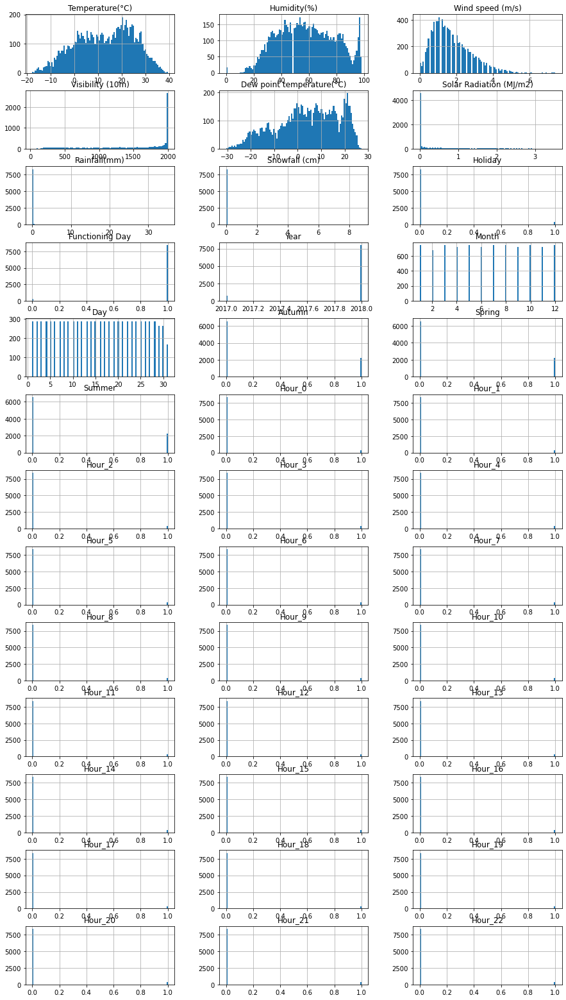

In [27]:
Dataset.hist(column=list(Dataset)[1:], figsize=(15,30),bins=100, layout=(14,3))

array([[<AxesSubplot:title={'center':'Solar Radiation (MJ/m2)'}>]],
      dtype=object)

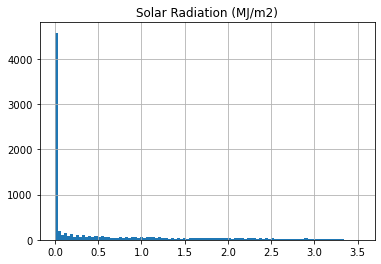

In [31]:
Dataset.hist(column='Solar Radiation (MJ/m2)',bins=100)

array([[<AxesSubplot:title={'center':'Rented Bike Count'}>]], dtype=object)

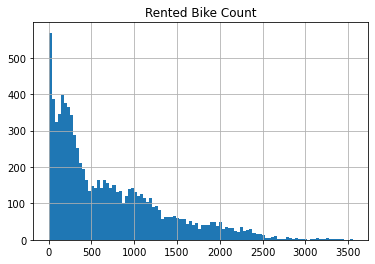

In [32]:
Dataset.hist(column='Rented Bike Count', bins=100)

In [33]:
Dataset.skew(axis=0, skipna=True, level=None)

Rented Bike Count             1.153428
Temperature(°C)              -0.198326
Humidity(%)                   0.059579
Wind speed (m/s)              0.890955
Visibility (10m)             -0.701786
Dew point temperature(°C)    -0.367298
Solar Radiation (MJ/m2)       1.504040
Rainfall(mm)                 14.533232
Snowfall (cm)                 8.440801
Holiday                       4.163603
Functioning Day              -5.170969
Year                         -2.978262
Month                        -0.010458
Day                           0.007522
Autumn                        1.159123
Spring                        1.142294
Summer                        1.142294
Hour_0                        4.588103
Hour_1                        4.588103
Hour_2                        4.588103
Hour_3                        4.588103
Hour_4                        4.588103
Hour_5                        4.588103
Hour_6                        4.588103
Hour_7                        4.588103
Hour_8                   

In [34]:
Dataset.corr()

,Rented Bike Count,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,...,Hour_13,Hour_14,Hour_15,Hour_16,Hour_17,Hour_18,Hour_19,Hour_20,Hour_21,Hour_22
Rented Bike Count,1.000000,0.538558,-0.199780,0.121108,0.199280,0.379788,0.261837,-0.123074,-0.141804,-7.233757e-02,...,9.260713e-03,1.753005e-02,4.027782e-02,7.307174e-02,1.402814e-01,2.580965e-01,1.585924e-01,1.177976e-01,1.056690e-01,7.054205e-02
Temperature(°C),0.538558,1.000000,0.159371,-0.036252,0.034794,0.912798,0.353505,0.050282,-0.218405,-5.593084e-02,...,5.887867e-02,6.867398e-02,7.250506e-02,7.006580e-02,5.886433e-02,4.221039e-02,2.439899e-02,8.845113e-03,-2.404187e-03,-1.178817e-02
Humidity(%),-0.199780,0.159371,1.000000,-0.336683,-0.543090,0.536894,-0.461919,0.236397,0.108183,-5.027765e-02,...,-1.342403e-01,-1.475392e-01,-1.500924e-01,-1.397675e-01,-1.106445e-01,-7.548927e-02,-3.612552e-02,-5.319109e-03,1.928674e-02,3.887041e-02
Wind speed (m/s),0.121108,-0.036252,-0.336683,1.000000,0.171507,-0.176486,0.332274,-0.019674,-0.003554,2.301677e-02,...,1.116966e-01,1.290072e-01,1.528230e-01,1.535948e-01,1.462075e-01,1.030964e-01,6.985342e-02,4.052463e-02,5.021361e-03,-2.756006e-02
Visibility (10m),0.199280,0.034794,-0.543090,0.171507,1.000000,-0.176630,0.149738,-0.167629,-0.121695,3.177281e-02,...,1.892512e-02,2.595586e-02,3.525379e-02,3.723078e-02,3.954493e-02,4.281799e-02,3.971492e-02,2.980558e-02,1.913926e-02,1.181831e-02
Dew point temperature(°C),0.379788,0.912798,0.536894,-0.176486,-0.176630,1.000000,0.094381,0.125597,-0.150887,-6.675910e-02,...,-1.169006e-02,-1.156320e-02,-9.428526e-03,-6.182765e-03,-1.024325e-04,4.048816e-03,7.924482e-03,9.236784e-03,9.989170e-03,1.016852e-02
Solar Radiation (MJ/m2),0.261837,0.353505,-0.461919,0.332274,0.149738,0.094381,1.000000,-0.074290,-0.072301,-5.077255e-03,...,3.183569e-01,2.930517e-01,2.387454e-01,1.550106e-01,5.467755e-02,-4.213728e-02,-1.053017e-01,-1.333426e-01,-1.366044e-01,-1.366044e-01
Rainfall(mm),-0.123074,0.050282,0.236397,-0.019674,-0.167629,0.125597,-0.074290,1.000000,0.008500,-1.426911e-02,...,1.505454e-02,-1.416413e-02,-3.124845e-03,-1.760758e-02,-5.403597e-03,2.133376e-02,-6.973404e-03,1.935885e-02,1.794095e-02,-1.234113e-02
Snowfall (cm),-0.141804,-0.218405,0.108183,-0.003554,-0.121695,-0.150887,-0.072301,0.008500,1.000000,-1.259072e-02,...,3.008616e-03,-4.709138e-03,-1.072637e-02,-1.399660e-02,-1.360418e-02,-1.111880e-02,-8.502610e-03,-7.194516e-03,-7.194516e-03,-7.325325e-03
Holiday,-0.072338,-0.055931,-0.050278,0.023017,0.031773,-0.066759,-0.005077,-0.014269,-0.012591,1.000000e+00,...,3.032612e-17,2.812466e-17,2.540602e-17,2.852742e-17,2.620239e-17,3.651857e-17,4.314126e-17,3.567186e-17,2.177430e-17,3.478281e-17


In [35]:
def plot_corr(Dataset, size=26):
    corr = Dataset.corr()
    fig, ax = plt.subplots(figsize=(size, size))
    ax.matshow(corr)
    plt.xticks(range(len(corr.columns)), corr.columns)
    plt.yticks(range(len(corr.columns)), corr.columns)

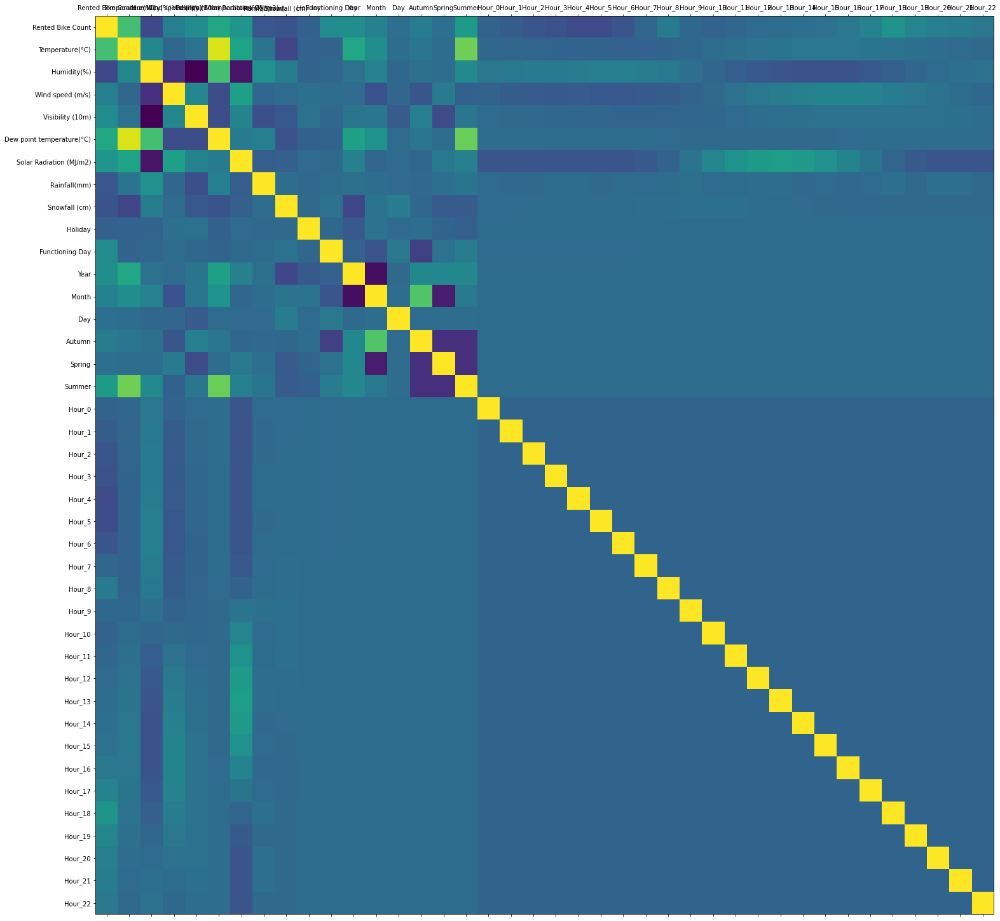

In [36]:
plot_corr(Dataset)

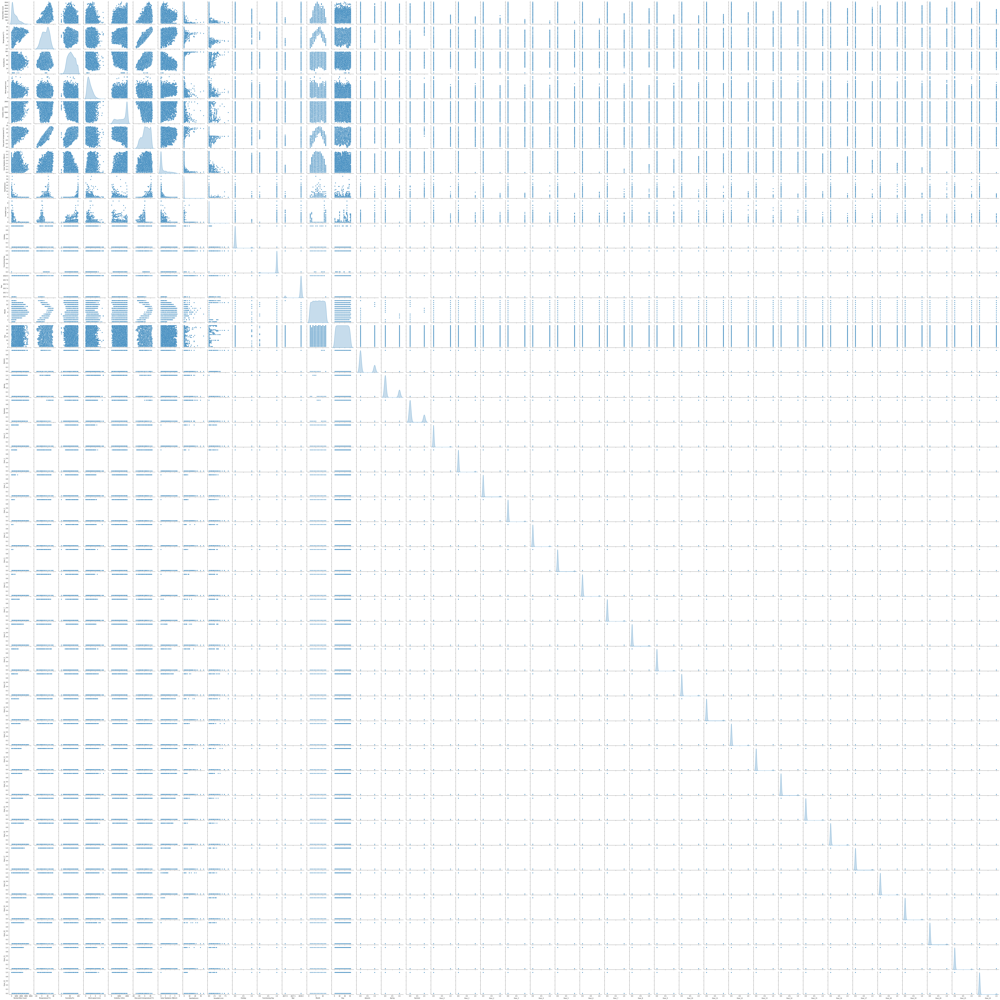

In [37]:
sns.pairplot(Dataset,diag_kind='kde')

<AxesSubplot:xlabel='Temperature(°C)', ylabel='Rented Bike Count'>

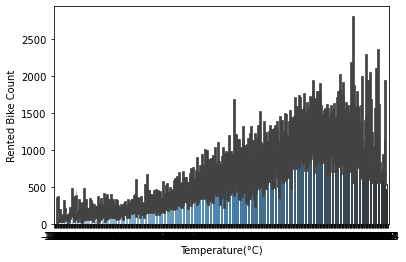

In [39]:
sns.barplot(x='Temperature(°C)', y='Rented Bike Count', data=Dataset, palette='Blues_d')

<AxesSubplot:xlabel='Temperature(°C)', ylabel='Rented Bike Count'>

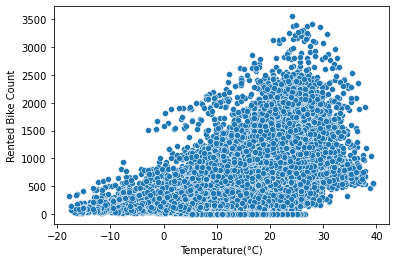

In [40]:
sns.scatterplot(x='Temperature(°C)', y='Rented Bike Count', data=Dataset, palette='Blues_d')

<AxesSubplot:xlabel='Temperature(°C)', ylabel='Dew point temperature(°C)'>

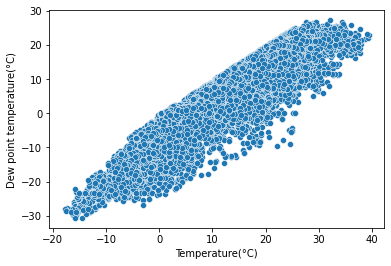

In [41]:
sns.scatterplot(x='Temperature(°C)', y='Dew point temperature(°C)', data=Dataset, palette='Blues_d')

From the above plot, we can observe the perfect linear relation between temperature and Dew point temperature. Due to collinearity issue, dropping one of the variables.

In [28]:
Dataset = Dataset.drop('Dew point temperature(°C)', axis =1)

In [29]:
Dataset.head()

,Rented Bike Count,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Functioning Day,...,Hour_13,Hour_14,Hour_15,Hour_16,Hour_17,Hour_18,Hour_19,Hour_20,Hour_21,Hour_22
0,254,-5.2,37,2.2,2000,0.0,0.0,0.0,0,1,...,0,0,0,0,0,0,0,0,0,0
1,204,-5.5,38,0.8,2000,0.0,0.0,0.0,0,1,...,0,0,0,0,0,0,0,0,0,0
2,173,-6.0,39,1.0,2000,0.0,0.0,0.0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,107,-6.2,40,0.9,2000,0.0,0.0,0.0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,78,-6.0,36,2.3,2000,0.0,0.0,0.0,0,1,...,0,0,0,0,0,0,0,0,0,0


In [30]:
Dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 39 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Rented Bike Count        8760 non-null   int64  
 1   Temperature(°C)          8760 non-null   float64
 2   Humidity(%)              8760 non-null   int64  
 3   Wind speed (m/s)         8760 non-null   float64
 4   Visibility (10m)         8760 non-null   int64  
 5   Solar Radiation (MJ/m2)  8760 non-null   float64
 6   Rainfall(mm)             8760 non-null   float64
 7   Snowfall (cm)            8760 non-null   float64
 8   Holiday                  8760 non-null   int64  
 9   Functioning Day          8760 non-null   int64  
 10  Year                     8760 non-null   int64  
 11  Month                    8760 non-null   int64  
 12  Day                      8760 non-null   int64  
 13  Autumn                   8760 non-null   uint8  
 14  Spring                  

<AxesSubplot:xlabel='Humidity(%)', ylabel='Rented Bike Count'>

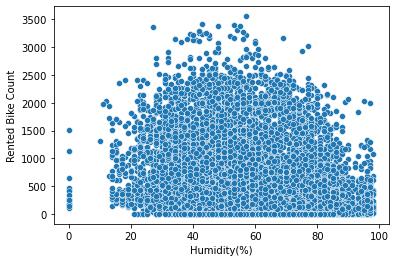

In [31]:
sns.scatterplot(y='Rented Bike Count', x='Humidity(%)', data=Dataset, palette='Blues_d')

<AxesSubplot:xlabel='Visibility (10m)', ylabel='Rented Bike Count'>

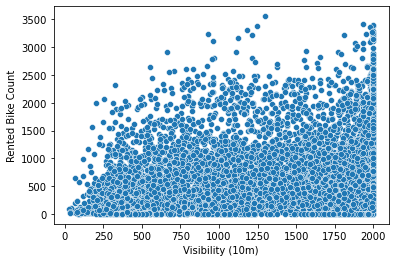

In [201]:
sns.scatterplot(y='Rented Bike Count', x='Visibility (10m)', data=Dataset, palette='Blues_d')

<AxesSubplot:xlabel='Humidity(%)', ylabel='Rented Bike Count'>

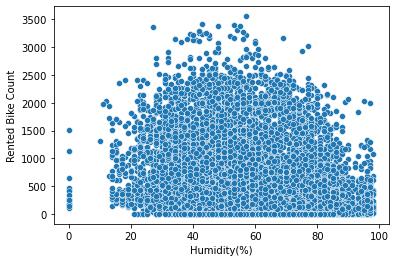

In [202]:
sns.scatterplot(y='Rented Bike Count', x='Humidity(%)', data=Dataset, palette='Blues_d')

<AxesSubplot:xlabel='Wind speed (m/s)'>

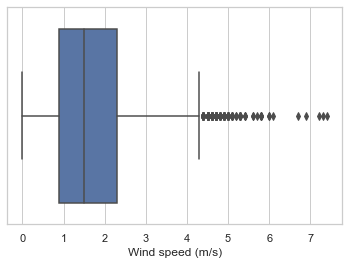

In [203]:
sns.set_theme(style="whitegrid")
sns.boxplot(x='Wind speed (m/s)', data = Dataset)

<AxesSubplot:xlabel='Solar Radiation (MJ/m2)'>

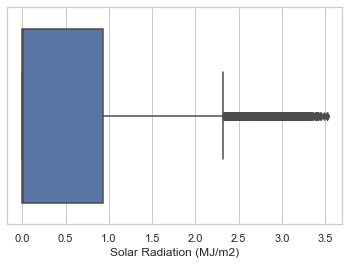

In [204]:
sns.set_theme(style="whitegrid")
sns.boxplot(x='Solar Radiation (MJ/m2)', data = Dataset)

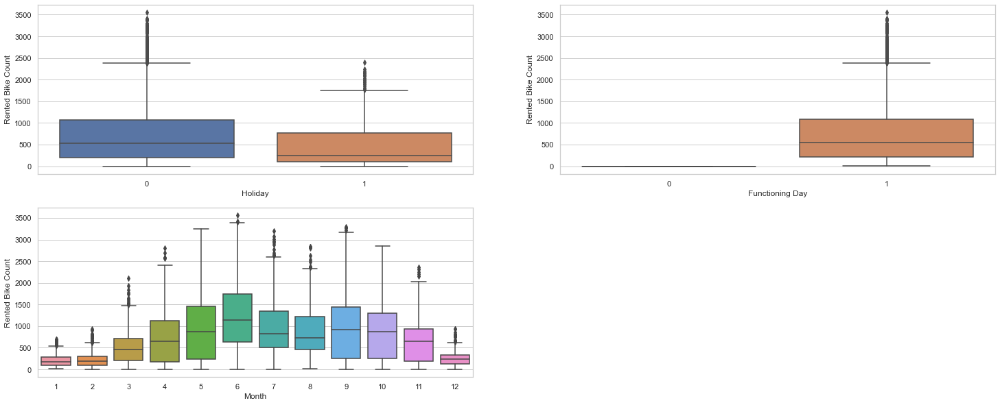

In [205]:
plt.figure(figsize=(25, 10))
plt.subplot(2,2,1)
sns.boxplot(x = 'Holiday', y = 'Rented Bike Count', data = Dataset)
plt.subplot(2,2,2)
sns.boxplot(x = 'Functioning Day', y = 'Rented Bike Count', data = Dataset)
plt.subplot(2,2,3)
sns.boxplot(x = 'Month', y = 'Rented Bike Count', data = Dataset)
plt.show()

## Part1: Data Spliting

Converting output to Binary classification

array([[<AxesSubplot:title={'center':'Rented Bike Count'}>]], dtype=object)

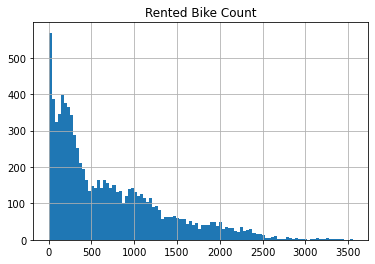

In [32]:
Dataset.hist(column='Rented Bike Count', bins=100)

In [33]:
median = statistics.median(Dataset['Rented Bike Count'])
median

504.5

In [34]:
Dataset[Dataset['Rented Bike Count'] > median].count()

Rented Bike Count          4380
Temperature(°C)            4380
Humidity(%)                4380
Wind speed (m/s)           4380
Visibility (10m)           4380
Solar Radiation (MJ/m2)    4380
Rainfall(mm)               4380
Snowfall (cm)              4380
Holiday                    4380
Functioning Day            4380
Year                       4380
Month                      4380
Day                        4380
Autumn                     4380
Spring                     4380
Summer                     4380
Hour_0                     4380
Hour_1                     4380
Hour_2                     4380
Hour_3                     4380
Hour_4                     4380
Hour_5                     4380
Hour_6                     4380
Hour_7                     4380
Hour_8                     4380
Hour_9                     4380
Hour_10                    4380
Hour_11                    4380
Hour_12                    4380
Hour_13                    4380
Hour_14                    4380
Hour_15 

In [35]:
Dataset['Rented Bike Count'].where(Dataset['Rented Bike Count'] > median, 1, inplace = True)

In [36]:
Dataset['Rented Bike Count'].where(Dataset['Rented Bike Count'] <= median, 0, inplace = True)

In [37]:
pd.unique(Dataset['Rented Bike Count'])

array([1, 0])

In [38]:
Dataset['Rented Bike Count'].value_counts()

1    4380
0    4380
Name: Rented Bike Count, dtype: int64

array([[<AxesSubplot:title={'center':'Rented Bike Count'}>]], dtype=object)

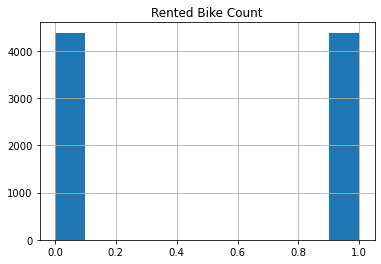

In [39]:
Dataset.hist(column = 'Rented Bike Count')

In [40]:
# Independent vs target variable
y = Dataset['Rented Bike Count']                  # Target variable
x = Dataset.drop(['Rented Bike Count'],axis=1)    # Predictor variable

In [41]:
# Split: Train and Test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=1)  # shuffle=True

In [42]:
x_train.head()

,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Functioning Day,Year,...,Hour_13,Hour_14,Hour_15,Hour_16,Hour_17,Hour_18,Hour_19,Hour_20,Hour_21,Hour_22
5129,25.3,87,0.6,751,0.49,0.0,0.0,0,1,2018,...,0,0,0,0,1,0,0,0,0,0
6490,25.4,75,0.7,1995,0.96,0.0,0.0,0,1,2018,...,0,0,0,0,0,0,0,0,0,0
6672,21.1,64,1.5,2000,0.00,0.0,0.0,0,1,2018,...,0,0,0,0,0,0,0,0,0,0
68,5.2,87,1.4,253,0.00,0.0,0.0,0,1,2017,...,0,0,0,0,0,0,0,1,0,0
8224,11.7,96,1.4,587,0.02,0.0,0.0,0,1,2018,...,0,0,0,1,0,0,0,0,0,0


In [43]:
x_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6132 entries, 5129 to 235
Data columns (total 38 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Temperature(°C)          6132 non-null   float64
 1   Humidity(%)              6132 non-null   int64  
 2   Wind speed (m/s)         6132 non-null   float64
 3   Visibility (10m)         6132 non-null   int64  
 4   Solar Radiation (MJ/m2)  6132 non-null   float64
 5   Rainfall(mm)             6132 non-null   float64
 6   Snowfall (cm)            6132 non-null   float64
 7   Holiday                  6132 non-null   int64  
 8   Functioning Day          6132 non-null   int64  
 9   Year                     6132 non-null   int64  
 10  Month                    6132 non-null   int64  
 11  Day                      6132 non-null   int64  
 12  Autumn                   6132 non-null   uint8  
 13  Spring                   6132 non-null   uint8  
 14  Summer                

In [44]:
x_test.head()

,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Functioning Day,Year,...,Hour_13,Hour_14,Hour_15,Hour_16,Hour_17,Hour_18,Hour_19,Hour_20,Hour_21,Hour_22
4136,18.2,63,0.8,1731,1.00,0.0,0.0,1,1,2018,...,0,0,0,0,0,0,0,0,0,0
6705,23.5,72,0.5,1485,0.95,0.0,0.0,0,1,2018,...,0,0,0,0,0,0,0,0,0,0
3538,15.3,50,1.0,944,1.97,0.0,0.0,0,1,2018,...,0,0,0,0,0,0,0,0,0,0
6583,21.1,81,1.0,1738,0.14,0.0,0.0,0,1,2018,...,0,0,0,0,0,0,0,0,0,0
1993,-2.2,58,1.0,2000,0.00,0.0,0.0,0,1,2018,...,0,0,0,0,0,0,0,0,0,0


Data Scaling:

In [45]:
print(x_train['Rainfall(mm)'].describe())
print(x_train['Snowfall (cm)'].describe())
print(x_test['Rainfall(mm)'].describe())
print(x_test['Snowfall (cm)'].describe())

count    6132.000000
mean        0.155545
std         1.192167
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max        35.000000
Name: Rainfall(mm), dtype: float64
count    6132.000000
mean        0.075718
std         0.428246
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         8.800000
Name: Snowfall (cm), dtype: float64
count    2628.000000
mean        0.132686
std         0.962546
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max        18.000000
Name: Rainfall(mm), dtype: float64
count    2628.000000
mean        0.073554
std         0.456043
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         8.800000
Name: Snowfall (cm), dtype: float64


In [46]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x_train_transform=sc.fit_transform(x_train)

In [47]:
sc=StandardScaler()
x_test_transform=sc.fit_transform(x_test)

In [48]:
print(x_test_transform)

[[ 0.44609838  0.25194735 -0.92577124 ... -0.19992084 -0.21585871
  -0.19260192]
 [ 0.89918082  0.69319567 -1.22243346 ... -0.19992084 -0.21585871
  -0.19260192]
 [ 0.19818534 -0.38541135 -0.72799643 ... -0.19992084 -0.21585871
  -0.19260192]
 ...
 [-1.19525687 -1.12082523  0.95308945 ... -0.19992084 -0.21585871
  -0.19260192]
 [-0.00698406 -0.97374245  0.85420205 ... -0.19992084 -0.21585871
  -0.19260192]
 [-1.01573364 -0.87568727 -1.22243346 ... -0.19992084 -0.21585871
   5.19205613]]


In [49]:
class_names = [0,1]

In [135]:
alpha=[0.1,0.01,0.001,0.0001,0.00001]
tol=[1e-3,1e-6,1e-9,1e-12,1e-15,1e-18,1e-21,1e-24]
SGDtrainscore1=[]
SGDtestscore1=[]
SGDtrainerror1=[]
SGDtesterror1=[]
SGDIterations1=[]
SGDtimecmplx1=[]
SGDtrainscore2=[]
SGDtestscore2=[]
SGDtrainerror2=[]
SGDtesterror2=[]
SGDIterations2=[]
SGDtimecmplx2=[]
from sklearn.linear_model import SGDClassifier

In [129]:
for i in range(len(alpha)):
    sgdstarttime=time.time()
    sgdmodel = SGDClassifier(alpha=alpha[i],max_iter=1000000,tol=1e-3,learning_rate='optimal',random_state=42,shuffle=True)
    sgdmodel.fit(x_train_transform, y_train)
    sgdendtime=time.time()
    sgdmodeltime=sgdendtime-sgdstarttime
    sgdtrainscore1=sgdmodel.score(x_train_transform, y_train)
    sgdtestscore1=sgdmodel.score(x_test_transform, y_test)
    sgdtrainerror1=1-sgdtrainscore1
    sgdtesterror1=1-sgdtestscore1
    sgditerations1=sgdmodel.n_iter_
    SGDtrainscore1.append(sgdtrainscore1)
    SGDtestscore1.append(sgdtestscore1)
    SGDtrainerror1.append(sgdtrainerror1)
    SGDtesterror1.append(sgdtesterror1)
    SGDIterations1.append(sgditerations1)
    SGDtimecmplx1.append(sgdmodeltime)
print(SGDtrainscore1,SGDtestscore1,SGDtrainerror1,SGDtesterror1,SGDIterations1,SGDtimecmplx1)

[0.895955642530985, 0.9122635355512068, 0.9168297455968689, 0.9098173515981736, 0.884703196347032] [0.9003044140030442, 0.9113394216133942, 0.91324200913242, 0.9056316590563166, 0.8915525114155252] [0.10404435746901497, 0.08773646444879324, 0.08317025440313108, 0.09018264840182644, 0.11529680365296802] [0.09969558599695583, 0.08866057838660579, 0.08675799086757996, 0.0943683409436834, 0.10844748858447484] [10, 12, 27, 43, 90] [0.017301082611083984, 0.010200977325439453, 0.01620316505432129, 0.0221710205078125, 0.03913998603820801]


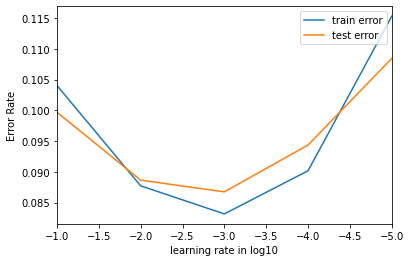

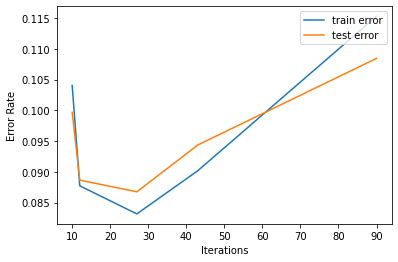

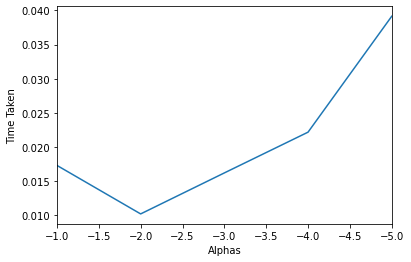

In [131]:
plt.plot(np.log10(alpha),SGDtrainerror1 ,label="train error")
plt.plot(np.log10(alpha),SGDtesterror1,label="test error")
plt.legend(loc="upper right")
plt.xlabel("learning rate in log10")
plt.ylabel("Error Rate")
plt.xlim(-1,-5)
plt.show()
plt.plot(SGDIterations1, SGDtrainerror1,label="train error")
plt.plot(SGDIterations1, SGDtesterror1,label="test error")
plt.legend(loc="upper right")
plt.xlabel("Iterations")
plt.ylabel("Error Rate")
plt.show()
plt.plot(np.log10(alpha),SGDtimecmplx1)
plt.xlabel("Alphas")
plt.ylabel("Time Taken")
plt.xlim(-1,-5)
plt.show()

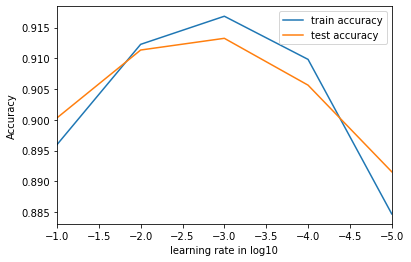

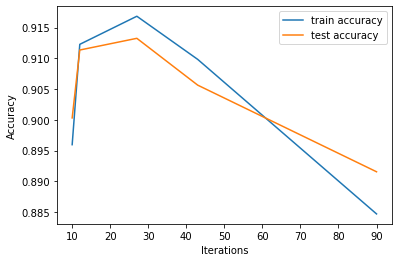

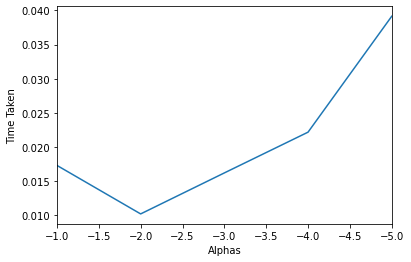

In [133]:
plt.plot(np.log10(alpha),SGDtrainscore1 ,label="train accuracy")
plt.plot(np.log10(alpha),SGDtestscore1,label="test accuracy")
plt.legend(loc="upper right")
plt.xlabel("learning rate in log10")
plt.ylabel("Accuracy")
plt.xlim(-1,-5)
plt.show()
plt.plot(SGDIterations1, SGDtrainscore1,label="train accuracy")
plt.plot(SGDIterations1, SGDtestscore1,label="test accuracy")
plt.legend(loc="upper right")
plt.xlabel("Iterations")
plt.ylabel("Accuracy")
plt.show()
plt.plot(np.log10(alpha),SGDtimecmplx1)
plt.xlabel("Alphas")
plt.ylabel("Time Taken")
plt.xlim(-1,-5)
plt.show()

In [136]:
for i in range(len(tol)):
    sgdstarttime=time.time()
    sgdmodel = SGDClassifier(alpha=0.01,max_iter=1000000,tol=tol[i],learning_rate='optimal',random_state=42,shuffle=True)
    sgdmodel.fit(x_train_transform, y_train)
    sgdendtime=time.time()
    sgdmodeltime=sgdendtime-sgdstarttime
    sgdtrainscore2=sgdmodel.score(x_train_transform, y_train)
    sgdtestscore2=sgdmodel.score(x_test_transform, y_test)
    sgdtrainerror2=1-sgdtrainscore2
    sgdtesterror2=1-sgdtestscore2
    sgditerations2=sgdmodel.n_iter_
    SGDtrainscore2.append(sgdtrainscore2)
    SGDtestscore2.append(sgdtestscore2)
    SGDtrainerror2.append(sgdtrainerror2)
    SGDtesterror2.append(sgdtesterror2)
    SGDIterations2.append(sgditerations2)
    SGDtimecmplx2.append(sgdmodeltime)
print(SGDtrainscore2,SGDtestscore2,sgdtrainerror2,sgdtesterror2,SGDIterations2,SGDtimecmplx2)

[0.9122635355512068, 0.9106327462491846, 0.9106327462491846, 0.9106327462491846, 0.9106327462491846, 0.9106327462491846, 0.9106327462491846, 0.9106327462491846] [0.9113394216133942, 0.9094368340943684, 0.9094368340943684, 0.9094368340943684, 0.9094368340943684, 0.9094368340943684, 0.9094368340943684, 0.9094368340943684] 0.08936725375081545 0.09056316590563163 [12, 62, 62, 62, 62, 62, 62, 62] [0.01865220069885254, 0.03845405578613281, 0.033530235290527344, 0.028915882110595703, 0.0280458927154541, 0.028846263885498047, 0.02903294563293457, 0.028879880905151367]


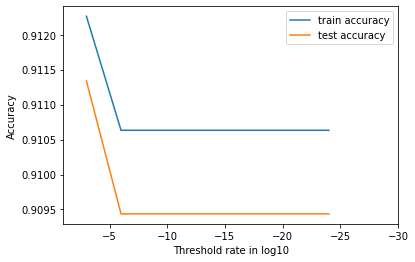

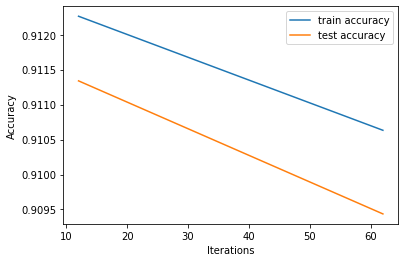

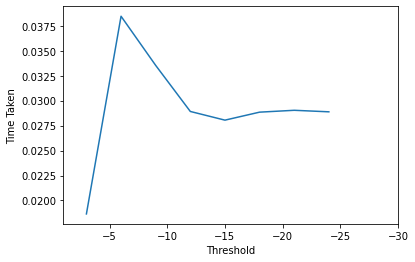

In [137]:
plt.plot(np.log10(tol), SGDtrainscore2,label="train accuracy")
plt.plot(np.log10(tol), SGDtestscore2,label="test accuracy")
plt.legend(loc="upper right")
plt.xlabel("Threshold rate in log10")
plt.ylabel("Accuracy")
plt.xlim(-1,-30)
plt.show()
plt.plot(SGDIterations2, SGDtrainscore2,label="train accuracy")
plt.plot(SGDIterations2, SGDtestscore2,label="test accuracy")
plt.legend(loc="upper right")
plt.xlabel("Iterations")
plt.ylabel("Accuracy")
plt.show()
plt.plot(np.log10(tol),SGDtimecmplx2)
plt.xlabel("Threshold")
plt.ylabel("Time Taken")
plt.xlim(-1,-30)
plt.show()

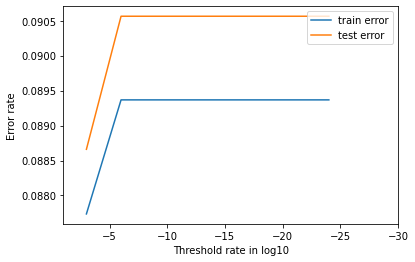

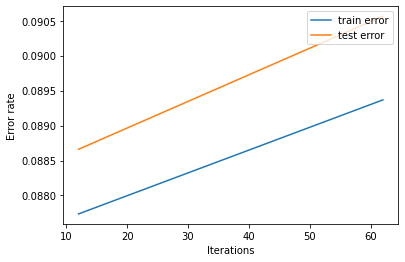

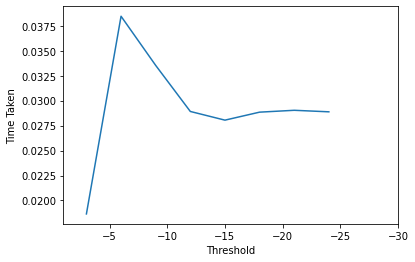

In [138]:
plt.plot(np.log10(tol), SGDtrainerror2,label="train error")
plt.plot(np.log10(tol), SGDtesterror2,label="test error")
plt.legend(loc="upper right")
plt.xlabel("Threshold rate in log10")
plt.ylabel("Error rate")
plt.xlim(-1,-30)
plt.show()
plt.plot(SGDIterations2, SGDtrainerror2,label="train error")
plt.plot(SGDIterations2, SGDtesterror2,label="test error")
plt.legend(loc="upper right")
plt.xlabel("Iterations")
plt.ylabel("Error rate")
plt.show()
plt.plot(np.log10(tol),SGDtimecmplx2)
plt.xlabel("Threshold")
plt.ylabel("Time Taken")
plt.xlim(-1,-30)
plt.show()

In [56]:
# SGD Optimised model :
sgdmodelopt = SGDClassifier(alpha=0.001,max_iter=1000000,tol=1e-6,learning_rate='optimal',random_state=42,shuffle=True)
sgdmodelopt.fit(x_train_transform, y_train)
print(sgdmodelopt.score(x_train_transform, y_train))
print(sgdmodelopt.score(x_test_transform, y_test))

0.9194390084801044
0.9140030441400304


Confusion matrix, without normalization
[[1239  108]
 [ 118 1163]]
Normalized confusion matrix
[[0.91982183 0.08017817]
 [0.09211553 0.90788447]]


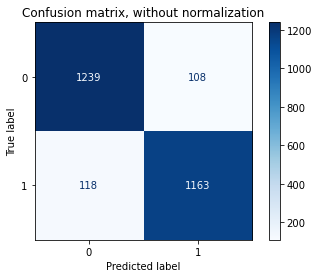

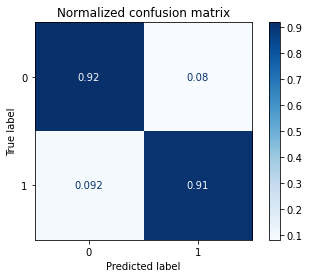

In [57]:
from sklearn.metrics import ConfusionMatrixDisplay
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        sgdmodelopt,
        x_test_transform,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

In [58]:
y_pred = sgdmodelopt.predict(x_test_transform) # This will give you positive class prediction probabilities  
sgdmodelopt.score(x_test_transform, y_pred)
auc_roc=metrics.roc_auc_score(y_test,y_pred)
auc_roc
from sklearn.metrics import roc_curve, auc
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

0.9138531457710689

Text(0.5, 0, 'False Positive Rate')

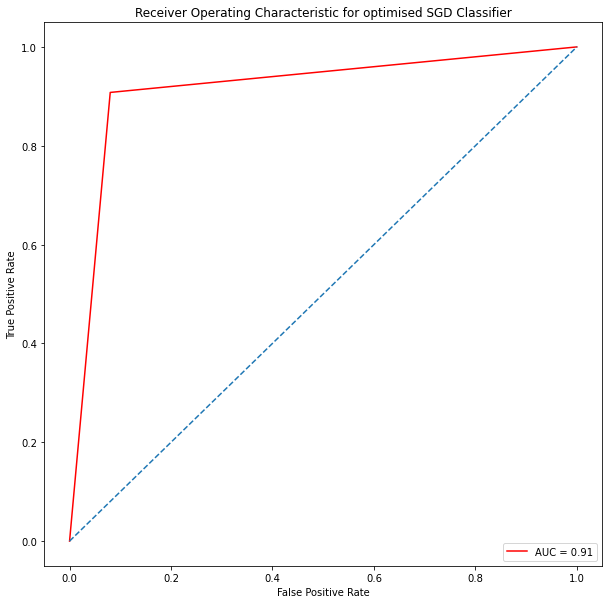

In [59]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
plt.title('Receiver Operating Characteristic for optimised SGD Classifier')
plt.plot(false_positive_rate,true_positive_rate, color='red',label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],linestyle='--')
plt.axis('tight')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

## Part 2: Support Vector Machine

array([[<AxesSubplot:title={'center':'Rented Bike Count'}>]], dtype=object)

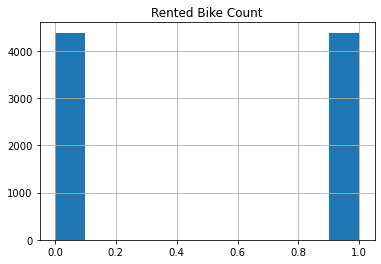

In [60]:
Dataset.hist(column = 'Rented Bike Count')

<AxesSubplot:xlabel='Temperature(°C)', ylabel='Holiday'>

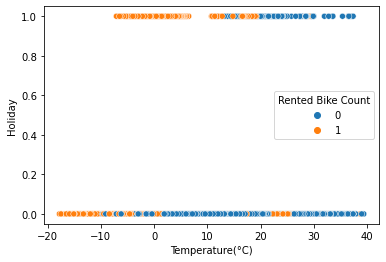

In [61]:
sns.scatterplot(data=Dataset, x="Temperature(°C)", y="Holiday",hue="Rented Bike Count")

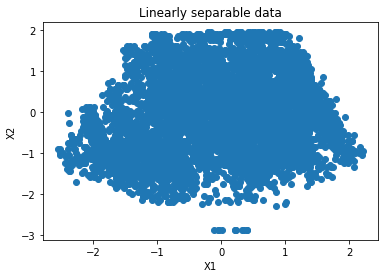

In [62]:
# Generate scatter plot for training data 
plt.scatter(x_train_transform[:,0], x_train_transform[:,1])
plt.title('Linearly separable data')
plt.xlabel('X1')
plt.ylabel('X2')
plt.show()

## Linear Kernel Function

In [140]:
C=[1.0,50.0,100.0,200.0,400.0]
kernel=['linear','rbf','sigmoid','poly']
from sklearn.svm import SVC
svctrainscore1=[]
svctestscore1=[]
svctrainerror1=[]
svctesterror1=[]
svctrainscore2=[]
svctestscore2=[]
svctrainerror2=[]
svctesterror2=[]
svctimecmplx1=[]
svctimecmplx2=[]

In [141]:
for i in range(len(C)):
    svcstarttime=time.time()
    svcmodel = svm.SVC(gamma='auto',C=C[i],kernel='linear',tol=0.001,random_state=42)
    svcmodel.fit(x_train_transform, y_train)
    svcendtime=time.time()
    svcmodeltime=svcendtime-svcstarttime
    trainscore=svcmodel.score(x_train_transform, y_train)
    testscore=svcmodel.score(x_test_transform, y_test)
    trainerror=1-trainscore
    testerror = 1-testscore
    svctrainscore1.append(trainscore)
    svctestscore1.append(testscore)
    svctrainerror1.append(trainerror)
    svctesterror1.append(testerror)
    svctimecmplx1.append(svcmodeltime)
print(svctrainscore1,svctestscore1,svctrainerror1,svctesterror1,svctimecmplx1)

[0.9202544031311155, 0.9200913242009132, 0.9200913242009132, 0.9200913242009132, 0.9200913242009132] [0.9166666666666666, 0.9166666666666666, 0.9166666666666666, 0.9166666666666666, 0.9162861491628614] [0.0797455968688845, 0.07990867579908678, 0.07990867579908678, 0.07990867579908678, 0.07990867579908678] [0.08333333333333337, 0.08333333333333337, 0.08333333333333337, 0.08333333333333337, 0.08371385083713856] [0.5284609794616699, 4.513525009155273, 7.79913592338562, 14.258892059326172, 27.702392101287842]


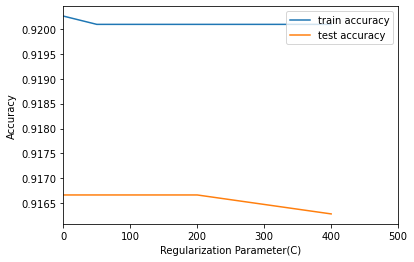

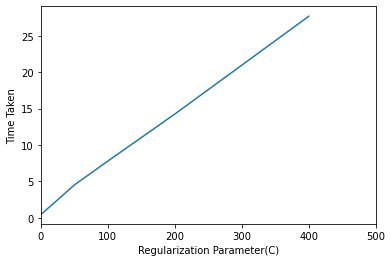

In [142]:
plt.plot(C,svctrainscore1,label="train accuracy")
plt.plot(C,svctestscore1,label="test accuracy")
plt.legend(loc="upper right")
plt.xlabel("Regularization Parameter(C)")
plt.ylabel("Accuracy")
plt.xlim(0,500)
plt.show()
plt.plot(C,svctimecmplx1)
plt.xlabel("Regularization Parameter(C)")
plt.ylabel("Time Taken")
plt.xlim(0,500)
plt.show()

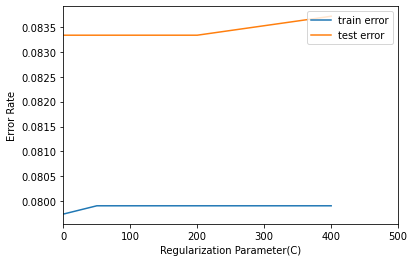

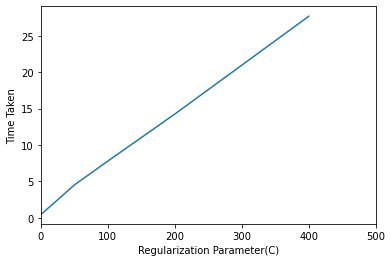

In [143]:
plt.plot(C,svctrainerror1,label="train error")
plt.plot(C,svctesterror1,label="test error")
plt.legend(loc="upper right")
plt.xlabel("Regularization Parameter(C)")
plt.ylabel("Error Rate")
plt.xlim(0,500)
plt.show()
plt.plot(C,svctimecmplx1)
plt.xlabel("Regularization Parameter(C)")
plt.ylabel("Time Taken")
plt.xlim(0,500)
plt.show()

In [144]:
for i in range(len(kernel)):
    svcstarttime=time.time()
    svcmodel = svm.SVC(gamma='auto',C=50.0,kernel=kernel[i],tol=0.001,random_state=42)
    svcmodel.fit(x_train_transform, y_train)
    svcendtime=time.time()
    svcmodeltime=svcendtime-svcstarttime
    trainscore=svcmodel.score(x_train_transform, y_train)
    testscore=svcmodel.score(x_test_transform, y_test)
    trainerror=1-trainscore
    testerror = 1-testscore
    svctrainscore2.append(trainscore)
    svctestscore2.append(testscore)
    svctrainerror2.append(trainerror)
    svctesterror2.append(testerror)
    svctimecmplx2.append(svcmodeltime)
print(svctrainscore2,svctestscore2,svctrainerror2,svctesterror2,svctimecmplx2)

[0.9200913242009132, 0.9646118721461188, 0.8440965427266797, 0.9629810828440966] [0.9166666666666666, 0.9235159817351598, 0.854261796042618, 0.9162861491628614] [0.07990867579908678, 0.035388127853881235, 0.15590345727332033, 0.03701891715590344] [0.08333333333333337, 0.07648401826484019, 0.14573820395738202, 0.08371385083713856] [4.465160846710205, 0.6023318767547607, 0.41179418563842773, 0.597465991973877]


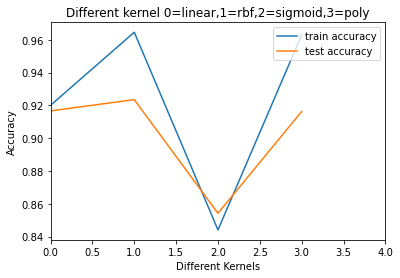

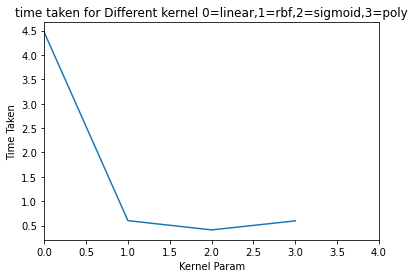

In [148]:
kernellist=[0,1,2,3]
plt.plot(kernellist,svctrainscore2,label="train accuracy")
plt.plot(kernellist,svctestscore2,label="test accuracy")
plt.legend(loc="upper right")
plt.xlabel("Different Kernels")
plt.ylabel("Accuracy")
plt.title("Different kernel 0=linear,1=rbf,2=sigmoid,3=poly")
plt.xlim(0,4)
plt.show()
plt.plot(kernellist,svctimecmplx2)
plt.xlabel("Kernel Param")
plt.ylabel("Time Taken")
plt.title("time taken for Different kernel 0=linear,1=rbf,2=sigmoid,3=poly")
plt.xlim(0,4)
plt.show()

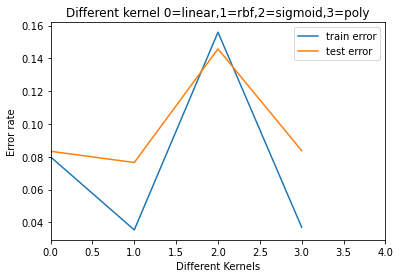

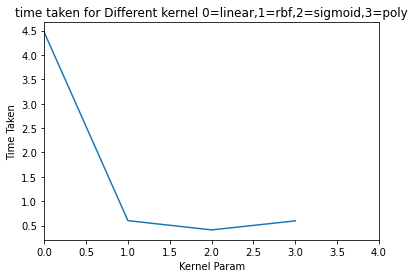

In [146]:
kernellist=[0,1,2,3]
plt.plot(kernellist,svctrainerror2,label="train error")
plt.plot(kernellist,svctesterror2,label="test error")
plt.legend(loc="upper right")
plt.xlabel("Different Kernels")
plt.ylabel("Error rate")
plt.title("Different kernel 0=linear,1=rbf,2=sigmoid,3=poly")
plt.xlim(0,4)
plt.show()
plt.plot(kernellist,svctimecmplx2)
plt.xlabel("Kernel Param")
plt.ylabel("Time Taken")
plt.title("time taken for Different kernel 0=linear,1=rbf,2=sigmoid,3=poly")
plt.xlim(0,4)
plt.show()

In [69]:
# Optimised SVC Classifier :
svcmodelopt = svm.SVC(gamma='auto',C=50.0,kernel='rbf',tol=0.001,random_state=42)
svcmodelopt.fit(x_train_transform, y_train)
svcmodelopttrainerror=svcmodelopt.score(x_train_transform, y_train)
svcmodelopttesterror=svcmodelopt.score(x_test_transform, y_test)
print(svcmodelopttrainerror,svcmodelopttesterror)

0.9646118721461188 0.9235159817351598


Confusion matrix, without normalization
[[1252   95]
 [ 106 1175]]
Normalized confusion matrix
[[0.9294729  0.0705271 ]
 [0.08274785 0.91725215]]


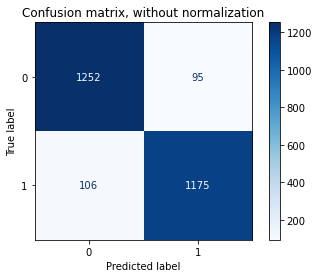

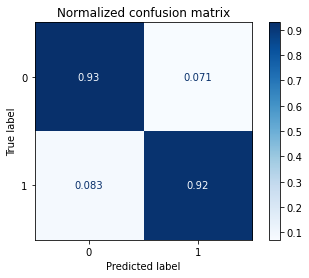

In [70]:
## Confusion Matrix with best intercept parameter ie.., at 100
from sklearn.metrics import ConfusionMatrixDisplay
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        svcmodelopt,
        x_test_transform,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

In [71]:
y_pred1 = svcmodelopt.predict(x_test_transform) # This will give you positive class prediction probabilities  
svcmodelopt.score(x_test_transform, y_pred1)
auc_roc=metrics.roc_auc_score(y_test,y_pred1)
auc_roc
from sklearn.metrics import roc_curve, auc
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred1)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

0.923362524753594

Text(0.5, 0, 'False Positive Rate')

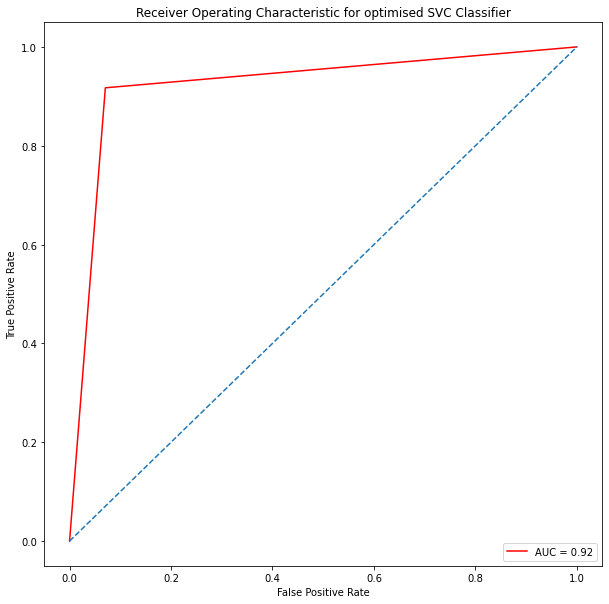

In [72]:
plt.figure(figsize=(10,10))
plt.title('Receiver Operating Characteristic for optimised SVC Classifier')
plt.plot(false_positive_rate,true_positive_rate, color='red',label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],linestyle='--')
plt.axis('tight')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

## Gaussian Kernel Radial Basis Function 

In [73]:
rbf_classifierstarttime=time.time()
rbf_classifier = svm.SVC(gamma='auto',C=1.0,kernel='rbf',tol=0.001)
rbf_classifier.fit(x_train_transform, y_train)
rbf_classifierendtime=time.time()
rbf_classifiertime=rbf_classifierendtime-rbf_classifierstarttime
y_pred_1 = rbf_classifier.predict(x_test_transform)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred_1))
print("Precision:",metrics.precision_score(y_test, y_pred_1))
print("Recall:",metrics.recall_score(y_test, y_pred_1))
rbf_classifier.kernel

Accuracy: 0.9147640791476408
Precision: 0.923138510808647
Recall: 0.9000780640124902


'rbf'

In [74]:
rbf_classifiertrainerror=rbf_classifier.score(x_train_transform, y_train)
rbf_classifiertesterror=rbf_classifier.score(x_test_transform, y_test)
rbf_classifiertrainerror,rbf_classifiertesterror,rbf_classifiertime

(0.927429876060013, 0.9147640791476408, 0.6319952011108398)

Confusion matrix, without normalization
[[1251   96]
 [ 128 1153]]
Normalized confusion matrix
[[0.92873051 0.07126949]
 [0.09992194 0.90007806]]


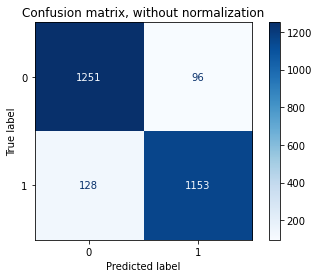

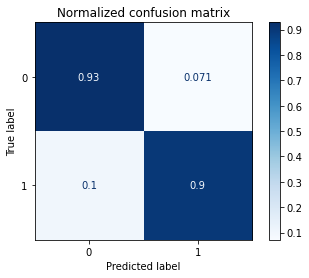

In [75]:
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        rbf_classifier,
        x_test_transform,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

## Polynomial Kernel Function

In [247]:
poly_classifierstarttime=time.time()
poly_classifier = svm.SVC(gamma='auto',C=1.0,kernel='poly',tol=0.001)
poly_classifier.fit(x_train_transform, y_train)
poly_classifierendtime=time.time()
poly_classifiertime=poly_classifierendtime-poly_classifierstarttime
y_pred_2 = poly_classifier.predict(x_test_transform)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred_2))
print("Precision:",metrics.precision_score(y_test, y_pred_2))
print("Recall:",metrics.recall_score(y_test, y_pred_2))

Accuracy: 0.9067732115677322
Precision: 0.9302325581395349
Recall: 0.8743169398907104


In [248]:
poly_classifiertrainerror=poly_classifier.score(x_train_transform, y_train)
poly_classifiertesterror=poly_classifier.score(x_test_transform, y_test)
poly_classifiertrainerror,poly_classifiertesterror,poly_classifiertime

(0.9179712981082844, 0.9067732115677322, 0.5912208557128906)

Confusion matrix, without normalization
[[1263   84]
 [ 161 1120]]
Normalized confusion matrix
[[0.9376392  0.0623608 ]
 [0.12568306 0.87431694]]


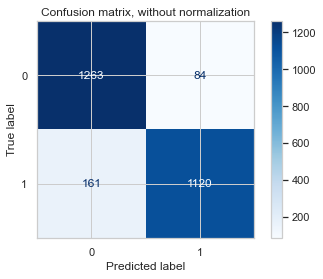

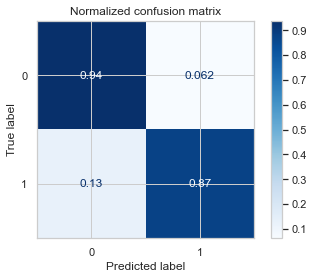

In [249]:
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        poly_classifier,
        x_test_transform,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

## Sigmoid Kernel Function

In [250]:
sigmoid_classifierstarttime=time.time()
sigmoid_classifier = svm.SVC(gamma='auto',C=1.0,kernel='sigmoid',tol=0.001)
sigmoid_classifier.fit(x_train_transform, y_train)
sigmoid_classifierendtime=time.time()
sigmoid_classifiertime=sigmoid_classifierendtime-sigmoid_classifierstarttime
y_pred_3 = sigmoid_classifier.predict(x_test_transform)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred_3))
print("Precision:",metrics.precision_score(y_test, y_pred_3))
print("Recall:",metrics.recall_score(y_test, y_pred_3))

Accuracy: 0.8614916286149162
Precision: 0.8476118271417741
Recall: 0.8727556596409055


In [251]:
sigmoid_classifiertrainerror=sigmoid_classifier.score(x_train_transform, y_train)
sigmoid_classifiertesterror=sigmoid_classifier.score(x_test_transform, y_test)
sigmoid_classifiertrainerror,sigmoid_classifiertesterror,sigmoid_classifiertime

(0.8556751467710372, 0.8614916286149162, 0.626215934753418)

Confusion matrix, without normalization
[[1146  201]
 [ 163 1118]]
Normalized confusion matrix
[[0.85077951 0.14922049]
 [0.12724434 0.87275566]]


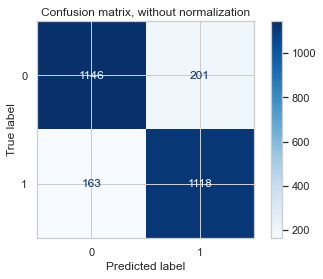

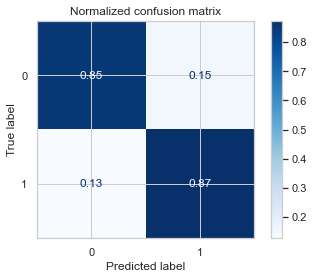

In [252]:
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        sigmoid_classifier,
        x_test_transform,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

## Part 3: Decision Tree

In [176]:
# Defaults to GINI
classifier1 = DecisionTreeClassifier()
classifier1 = classifier1.fit(x_train, y_train)
y_pred4 = classifier1.predict(x_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred4))
print("Precision:",metrics.precision_score(y_test, y_pred4))
print("Recall:",metrics.recall_score(y_test, y_pred4))

Accuracy: 0.906392694063927
Precision: 0.8959449120122418
Recall: 0.9141295862607338


In [177]:
print(classifier1.score(x_train, y_train))
print(classifier1.score(x_test, y_test))

1.0
0.906392694063927


In [78]:
print(classification_report(y_test, y_pred4))
print(confusion_matrix(y_test, y_pred4))

              precision    recall  f1-score   support

           0       0.92      0.90      0.91      1347
           1       0.90      0.92      0.91      1281

    accuracy                           0.91      2628
   macro avg       0.91      0.91      0.91      2628
weighted avg       0.91      0.91      0.91      2628

[[1211  136]
 [ 105 1176]]


Confusion matrix, without normalization
[[1211  136]
 [ 105 1176]]
Normalized confusion matrix
[[0.89903489 0.10096511]
 [0.08196721 0.91803279]]


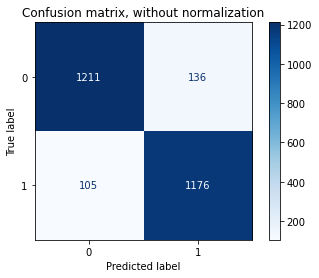

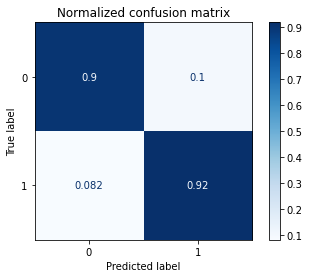

In [79]:
from sklearn.metrics import ConfusionMatrixDisplay
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        classifier1,
        x_test,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

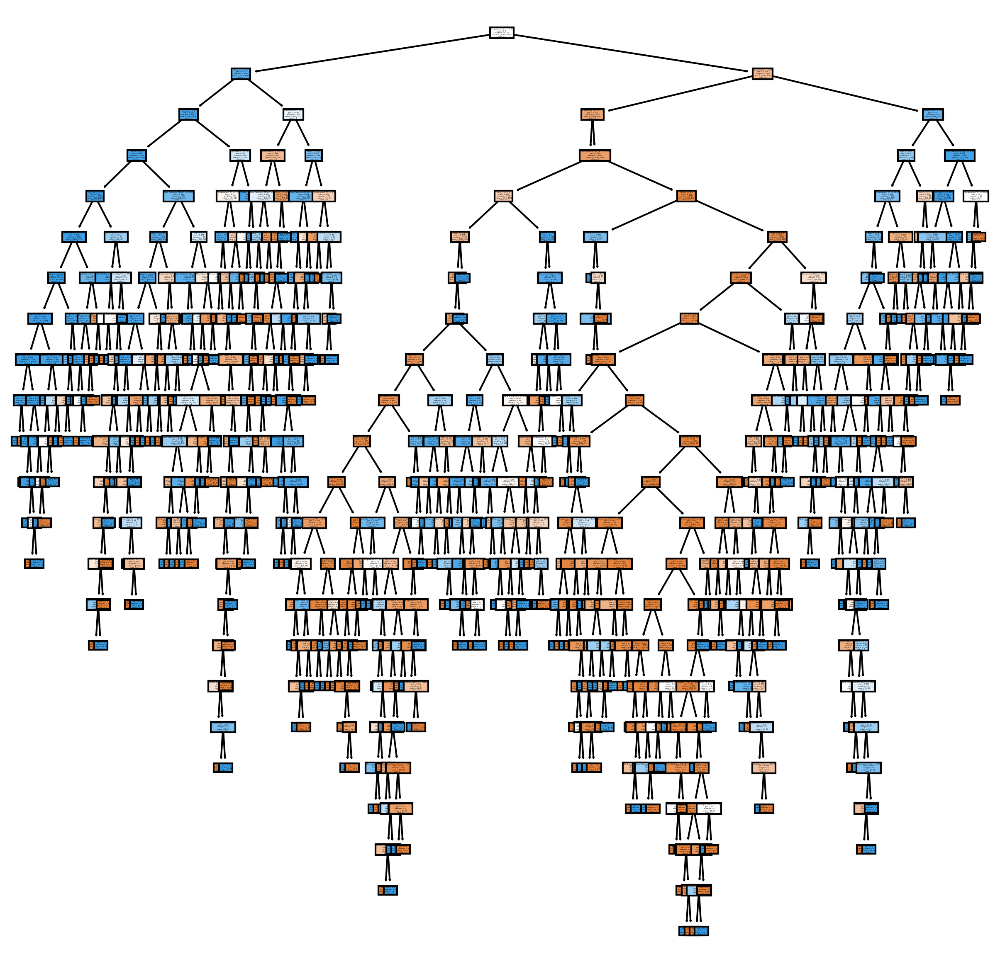

In [80]:
from sklearn.tree import plot_tree

fn = list(x_train)
cn = ['0', '1']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (10, 10), dpi=300)
plot_tree(classifier1, feature_names = fn, class_names=cn, filled = True)

fig.savefig('tree.png')

Entropy Metric:

In [178]:
classifier2 = DecisionTreeClassifier(criterion="entropy", random_state=1,max_depth=15,min_samples_split=4)
classifier2 = classifier2.fit(x_train, y_train)
y_pred5 = classifier2.predict(x_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred5))
print("Precision:",metrics.precision_score(y_test, y_pred5))
print("Recall:",metrics.recall_score(y_test, y_pred5))

Accuracy: 0.910958904109589
Precision: 0.9067599067599068
Recall: 0.9110070257611241


In [179]:
print(classifier2.score(x_train, y_train))
print(classifier2.score(x_test, y_test))

0.9840182648401826
0.910958904109589


Confusion matrix, without normalization
[[1227  120]
 [ 114 1167]]
Normalized confusion matrix
[[0.91091314 0.08908686]
 [0.08899297 0.91100703]]


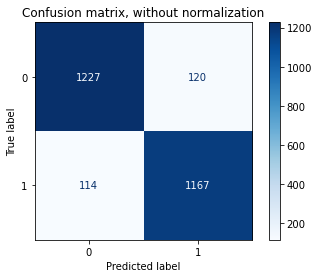

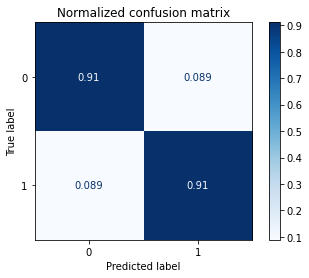

In [83]:
from sklearn.metrics import ConfusionMatrixDisplay
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        classifier2,
        x_test,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

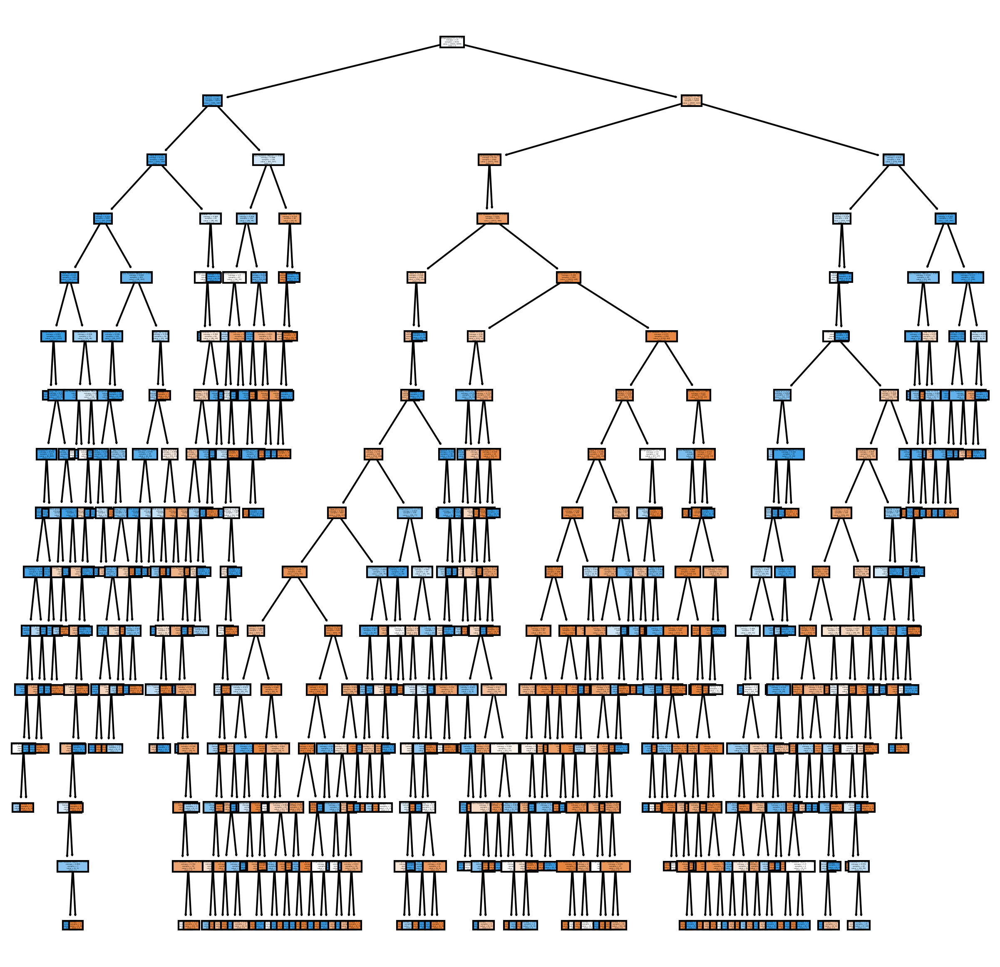

In [84]:
from sklearn.tree import plot_tree

fn = list(x_train)
cn = ['0', '1']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (10, 10), dpi=300)
plot_tree(classifier2, feature_names = fn, class_names=cn, filled = True)

fig.savefig('entropytree.png')

In [262]:
classifier3 = DecisionTreeClassifier(criterion="entropy")
classifier3 = classifier3.fit(x_train, y_train)
y_pred6 = classifier3.predict(x_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred6))
print("Precision:",metrics.precision_score(y_test, y_pred6))
print("Recall:",metrics.recall_score(y_test, y_pred6))

Accuracy: 0.9090563165905632
Precision: 0.901386748844376
Recall: 0.9133489461358314


In [263]:
print(classifier3.score(x_train, y_train))
print(classifier3.score(x_test, y_test))

1.0
0.9090563165905632


Gini Index:

In [180]:
classifier4 = DecisionTreeClassifier(criterion="gini", random_state=1,max_depth=15,min_samples_split=4)
classifier4 = classifier4.fit(x_train, y_train)
y_pred7 = classifier4.predict(x_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred7))
print("Precision:",metrics.precision_score(y_test, y_pred7))
print("Recall:",metrics.recall_score(y_test, y_pred7))

Accuracy: 0.906392694063927
Precision: 0.9020979020979021
Recall: 0.9063231850117096


In [181]:
print(classifier4.score(x_train, y_train))
print(classifier4.score(x_test, y_test))

0.9849967384213959
0.906392694063927


Confusion matrix, without normalization
[[1221  126]
 [ 120 1161]]
Normalized confusion matrix
[[0.9064588  0.0935412 ]
 [0.09367681 0.90632319]]


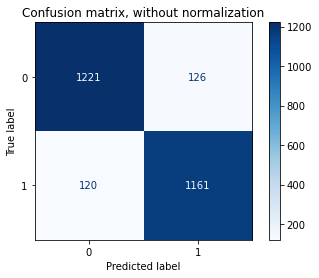

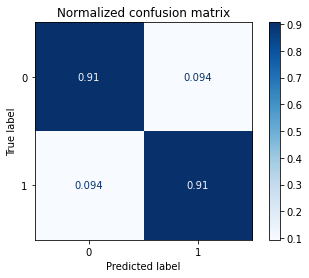

In [197]:
from sklearn.metrics import ConfusionMatrixDisplay
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        classifier4,
        x_test,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

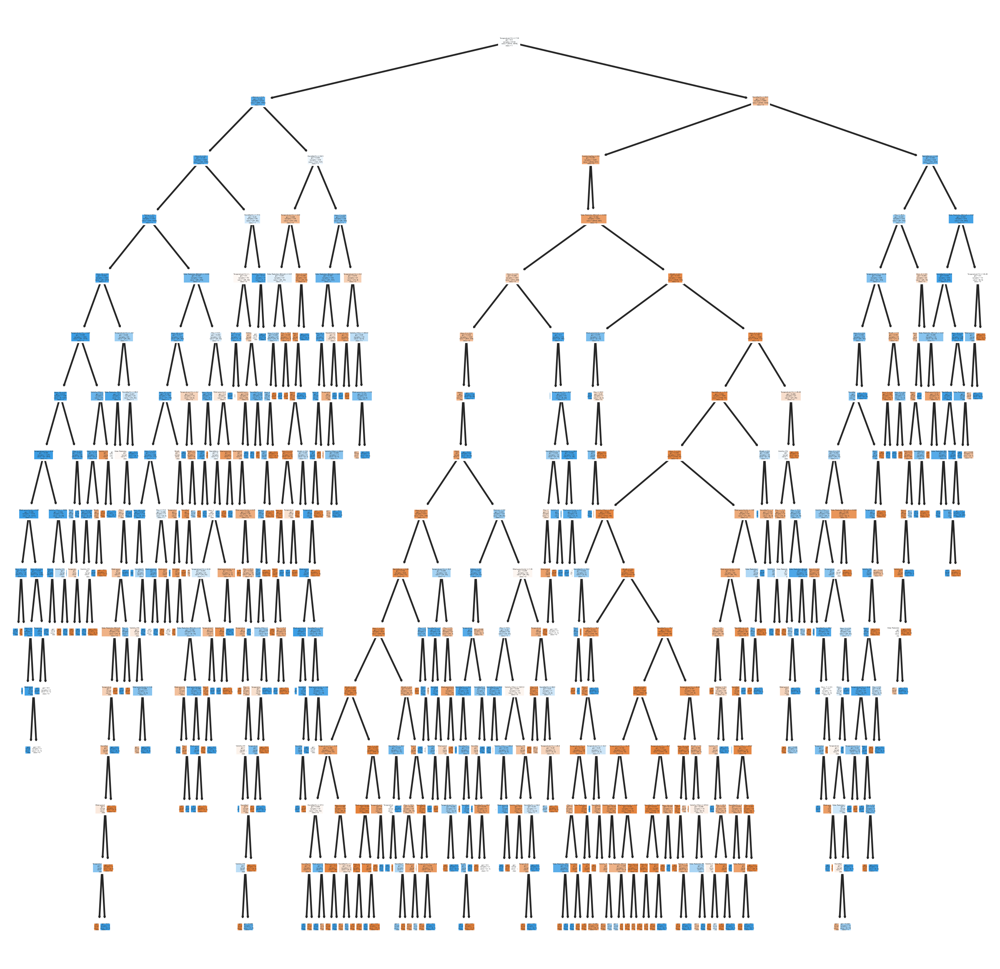

In [266]:
from sklearn.tree import plot_tree

fn = list(x_train)
cn = ['0', '1']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (10, 10), dpi=300)
plot_tree(classifier4, feature_names = fn, class_names=cn, filled = True)

fig.savefig('ginitree.png')

Pruning:

In [153]:
maxdepth=[5,10,15,20,25]
minsamplessplit=[5,10,15,20,25]
minsamplesleaf=[1,2,4,8,10]
check=10
dTreetrainscore1=[]
dTreetestscore1=[]
dTreetrainerror1=[]
dTreetesterror1=[]
dTreetrainscore2=[]
dTreetestscore2=[]
dTreetrainerror2=[]
dTreetesterror2=[]
dTreetrainscore3=[]
dTreetestscore3=[]
dTreetrainerror3=[]
dTreetesterror3=[]
dTreetimecmplx1=[]
dTreetimecmplx2=[]
dTreetimecmplx3=[]

In [154]:
for i in range(len(maxdepth)):
    dTreestarttime=time.time()
    dTree = DecisionTreeClassifier(criterion = 'gini', random_state=1,max_depth=maxdepth[i],min_samples_split=5,min_samples_leaf=1)
    dTree.fit(x_train, y_train)
    dTreeendtime=time.time()
    dTreetime=dTreeendtime-dTreestarttime
    trainscore=dTree.score(x_train, y_train)
    testscore=dTree.score(x_test, y_test)
    trainerror = 1-trainscore
    testerror=1-testscore
    dTreetrainscore1.append(trainscore)
    dTreetestscore1.append(testscore)
    dTreetrainerror1.append(trainerror)
    dTreetesterror1.append(testerror)
    dTreetimecmplx1.append(dTreetime)
print(dTreetrainscore1,dTreetestscore1,dTreetrainerror1,dTreetesterror1,dTreetimecmplx1)

[0.87573385518591, 0.9546640574037835, 0.9818982387475538, 0.9882583170254403, 0.9884213959556425] [0.8595890410958904, 0.9006849315068494, 0.9079147640791476, 0.9071537290715372, 0.9060121765601218] [0.12426614481409004, 0.04533594259621654, 0.018101761252446225, 0.011741682974559686, 0.01157860404435751] [0.1404109589041096, 0.09931506849315064, 0.09208523592085238, 0.09284627092846276, 0.09398782343987822] [0.0401458740234375, 0.02330493927001953, 0.024580717086791992, 0.024663925170898438, 0.024596214294433594]


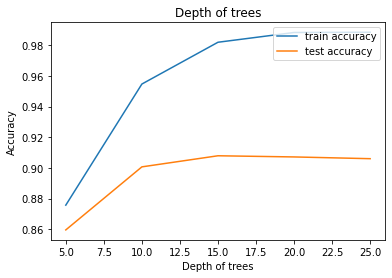

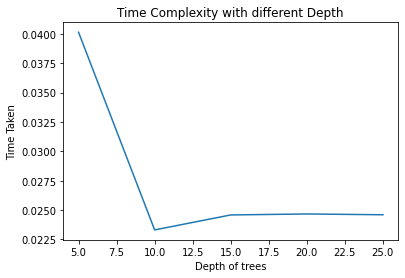

In [155]:
plt.plot(maxdepth,dTreetrainscore1,label="train accuracy")
plt.plot(maxdepth,dTreetestscore1,label="test accuracy")
plt.legend(loc="upper right")
plt.xlabel("Depth of trees")
plt.ylabel("Accuracy")
plt.title("Depth of trees")
plt.show()
plt.plot(maxdepth,dTreetimecmplx1)
plt.xlabel("Depth of trees")
plt.ylabel("Time Taken")
plt.title("Time Complexity with different Depth")
plt.show()

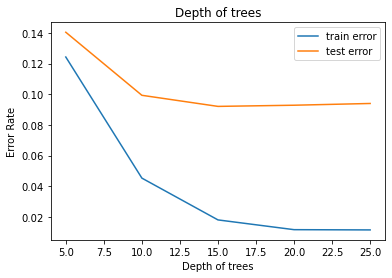

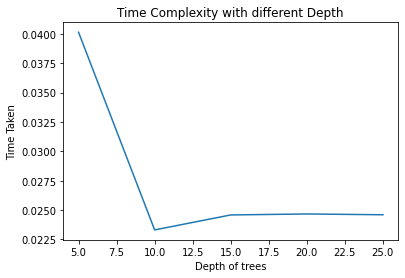

In [156]:
plt.plot(maxdepth,dTreetrainerror1,label="train error")
plt.plot(maxdepth,dTreetesterror1,label="test error")
plt.legend(loc="upper right")
plt.xlabel("Depth of trees")
plt.ylabel("Error Rate")
plt.title("Depth of trees")
plt.show()
plt.plot(maxdepth,dTreetimecmplx1)
plt.xlabel("Depth of trees")
plt.ylabel("Time Taken")
plt.title("Time Complexity with different Depth")
plt.show()

In [157]:
for i in range(len(minsamplessplit)):
    dTreestarttime=time.time()
    dTree = DecisionTreeClassifier(criterion = 'gini', random_state=1,max_depth=10,min_samples_split=minsamplessplit[i],min_samples_leaf=1)
    dTree.fit(x_train, y_train)
    dTreeendtime=time.time()
    dTreetime=dTreeendtime-dTreestarttime
    trainscore=dTree.score(x_train, y_train)
    testscore=dTree.score(x_test, y_test)
    trainerror = 1-trainscore
    testerror=1-testscore
    dTreetrainscore2.append(trainscore)
    dTreetestscore2.append(testscore)
    dTreetrainerror2.append(trainerror)
    dTreetesterror2.append(testerror)
    dTreetimecmplx2.append(dTreetime)
print(dTreetrainscore2,dTreetestscore2,dTreetrainerror2,dTreetesterror2,dTreetimecmplx2)

[0.9546640574037835, 0.9489562948467059, 0.9442270058708415, 0.9412915851272016, 0.9404761904761905] [0.9006849315068494, 0.8972602739726028, 0.899923896499239, 0.9014459665144596, 0.9014459665144596] [0.04533594259621654, 0.05104370515329415, 0.05577299412915848, 0.05870841487279843, 0.059523809523809534] [0.09931506849315064, 0.10273972602739723, 0.10007610350076102, 0.09855403348554037, 0.09855403348554037] [0.03088212013244629, 0.019779205322265625, 0.019226789474487305, 0.019089221954345703, 0.0194089412689209]


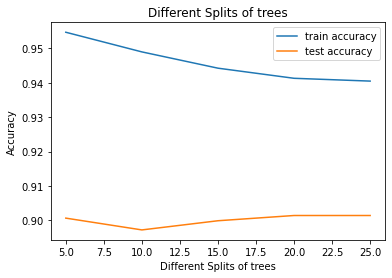

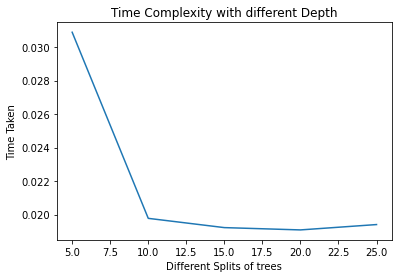

In [158]:
plt.plot(minsamplessplit,dTreetrainscore2,label="train accuracy")
plt.plot(minsamplessplit,dTreetestscore2,label="test accuracy")
plt.legend(loc="upper right")
plt.xlabel("Different Splits of trees")
plt.ylabel("Accuracy")
plt.title("Different Splits of trees")
plt.show()
plt.plot(minsamplessplit,dTreetimecmplx2)
plt.xlabel("Different Splits of trees")
plt.ylabel("Time Taken")
plt.title("Time Complexity with different Depth")
plt.show()

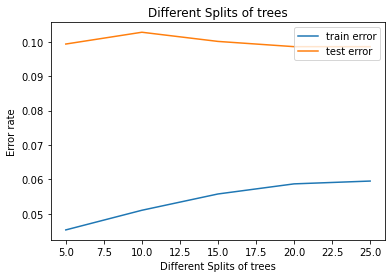

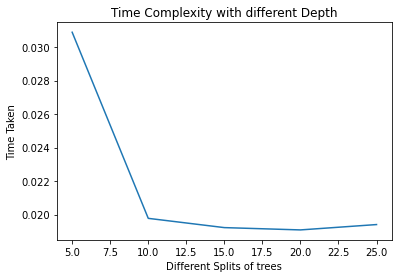

In [159]:
plt.plot(minsamplessplit,dTreetrainerror2,label="train error")
plt.plot(minsamplessplit,dTreetesterror2,label="test error")
plt.legend(loc="upper right")
plt.xlabel("Different Splits of trees")
plt.ylabel("Error rate")
plt.title("Different Splits of trees")
plt.show()
plt.plot(minsamplessplit,dTreetimecmplx2)
plt.xlabel("Different Splits of trees")
plt.ylabel("Time Taken")
plt.title("Time Complexity with different Depth")
plt.show()

In [160]:
for i in range(len(minsamplesleaf)):
    dTreestarttime=time.time()
    dTree = DecisionTreeClassifier(criterion = 'gini', random_state=1,max_depth=10,min_samples_split=10,min_samples_leaf=minsamplesleaf[i])
    dTree.fit(x_train, y_train)
    dTreeendtime=time.time()
    dTreetime=dTreeendtime-dTreestarttime
    trainscore=dTree.score(x_train, y_train)
    testscore=dTree.score(x_test, y_test)
    trainerror = 1-trainscore
    testerror=1-testscore
    dTreetrainscore3.append(trainscore)
    dTreetestscore3.append(testscore)
    dTreetrainerror3.append(trainerror)
    dTreetesterror3.append(testerror)
    dTreetimecmplx3.append(dTreetime)
print(dTreetrainscore3,dTreetestscore3,dTreetrainerror3,dTreetesterror3,dTreetimecmplx3)

[0.9489562948467059, 0.9476516634050881, 0.9447162426614482, 0.9368884540117417, 0.9315068493150684] [0.8972602739726028, 0.8961187214611872, 0.8968797564687976, 0.9090563165905632, 0.9067732115677322] [0.05104370515329415, 0.05234833659491189, 0.05528375733855184, 0.0631115459882583, 0.06849315068493156] [0.10273972602739723, 0.1038812785388128, 0.10312024353120242, 0.09094368340943682, 0.09322678843226784] [0.03472471237182617, 0.024984121322631836, 0.01989006996154785, 0.018005847930908203, 0.017820119857788086]


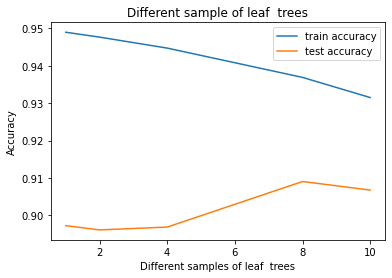

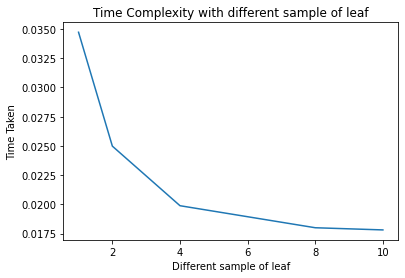

In [161]:
plt.plot(minsamplesleaf,dTreetrainscore3,label="train accuracy")
plt.plot(minsamplesleaf,dTreetestscore3,label="test accuracy")
plt.legend(loc="upper right")
plt.xlabel("Different samples of leaf  trees")
plt.ylabel("Accuracy")
plt.title("Different sample of leaf  trees")
plt.show()
plt.plot(minsamplesleaf,dTreetimecmplx3)
plt.xlabel("Different sample of leaf")
plt.ylabel("Time Taken")
plt.title("Time Complexity with different sample of leaf")
plt.show()

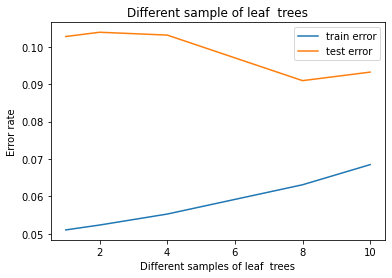

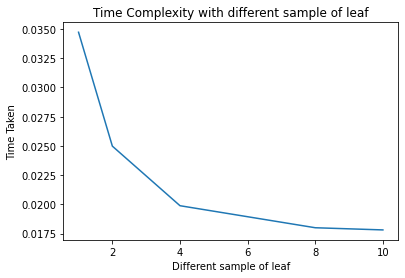

In [162]:
plt.plot(minsamplesleaf,dTreetrainerror3,label="train error")
plt.plot(minsamplesleaf,dTreetesterror3,label="test error")
plt.legend(loc="upper right")
plt.xlabel("Different samples of leaf  trees")
plt.ylabel("Error rate")
plt.title("Different sample of leaf  trees")
plt.show()
plt.plot(minsamplesleaf,dTreetimecmplx3)
plt.xlabel("Different sample of leaf")
plt.ylabel("Time Taken")
plt.title("Time Complexity with different sample of leaf")
plt.show()

In [110]:
### Optimistized the tree metrics :
dTreeopt1 = DecisionTreeClassifier(criterion = 'gini', random_state=1,max_depth=10,min_samples_split=15,min_samples_leaf=8)
dTreeopt1.fit(x_train, y_train)
print(dTreeopt1.score(x_train, y_train))
print(dTreeopt1.score(x_test, y_test))

0.9368884540117417
0.9090563165905632


In [111]:
### Optimistized the tree metrics :
dTreeopt2 = DecisionTreeClassifier(criterion = 'gini', random_state=1,max_depth=10,min_samples_split=5,min_samples_leaf=8)
dTreeopt2.fit(x_train, y_train)
print(dTreeopt2.score(x_train, y_train))
print(dTreeopt2.score(x_test, y_test))

0.9368884540117417
0.9090563165905632


Confusion matrix, without normalization
[[1229  118]
 [ 153 1128]]
Normalized confusion matrix
[[0.91239792 0.08760208]
 [0.11943794 0.88056206]]


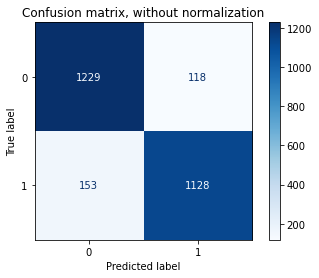

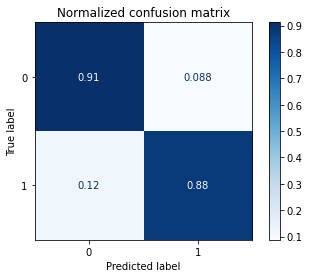

In [97]:
from sklearn.metrics import ConfusionMatrixDisplay
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        dTreeopt1,
        x_test,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

Confusion matrix, without normalization
[[1233  114]
 [ 154 1127]]
Normalized confusion matrix
[[0.91536748 0.08463252]
 [0.12021858 0.87978142]]


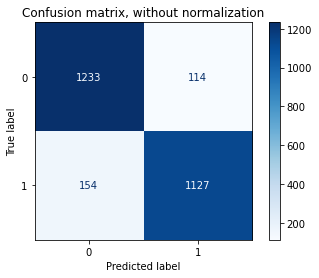

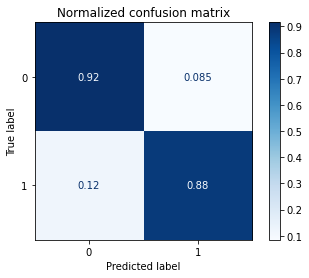

In [98]:
from sklearn.metrics import ConfusionMatrixDisplay
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        dTreeopt2,
        x_test,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

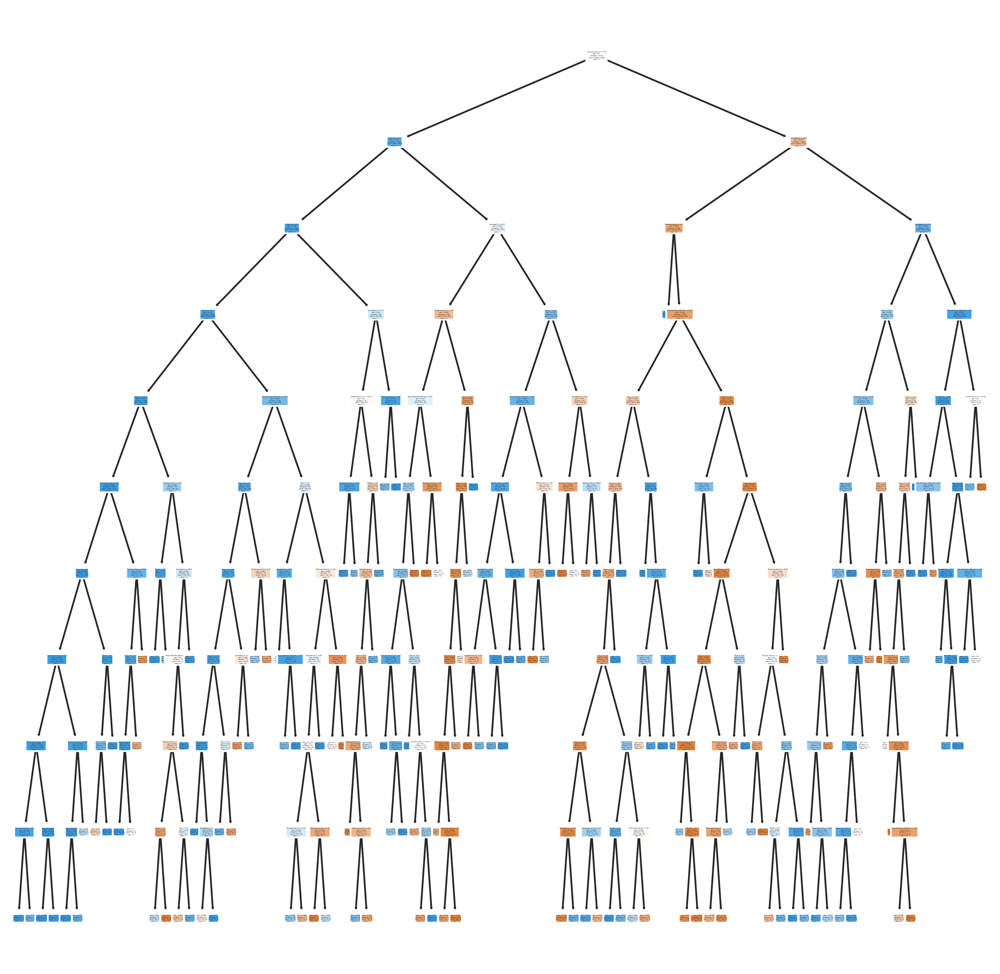

In [275]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

fn = list(x_train)
cn = ['0', '1']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (10, 10), dpi=300)
plot_tree(dTreeopt1, feature_names = fn, class_names=cn, filled = True)

fig.savefig('tree1.png')

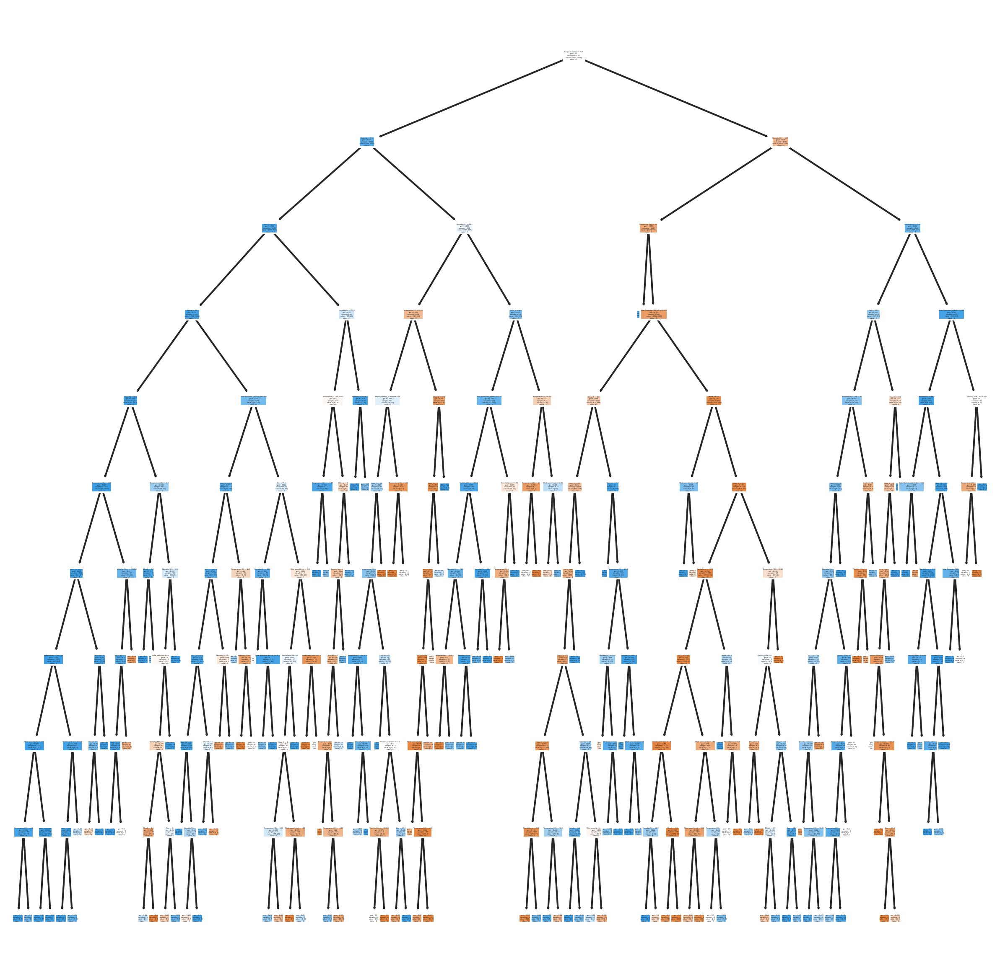

In [276]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

fn = list(x_train)
cn = ['0', '1']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (10, 10), dpi=300)
plot_tree(dTreeopt2, feature_names = fn, class_names=cn, filled = True)

fig.savefig('tree2.png')

Post Pruning:

In [99]:
path = dTree.cost_complexity_pruning_path(x_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities
dTrees = []
for ccp_alpha in ccp_alphas:
    dTree = DecisionTreeClassifier(random_state=1, ccp_alpha=ccp_alpha)
    dTree.fit(x_train, y_train)
    dTrees.append(dTree)

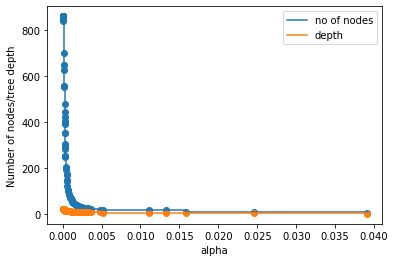

In [107]:
dTrees = dTrees[:-1]
ccp_alphas = ccp_alphas[:-1]
node_counts = [dTree.tree_.node_count for dTree in dTrees]
depth = [dTree.tree_.max_depth for dTree in dTrees]
plt.scatter(ccp_alphas,node_counts)
plt.scatter(ccp_alphas,depth)
plt.plot(ccp_alphas,node_counts,label='no of nodes',drawstyle="steps-post")
plt.plot(ccp_alphas,depth,label='depth',drawstyle="steps-post")
plt.xlabel("alpha")
plt.ylabel("Number of nodes/tree depth")
plt.legend()
plt.show()

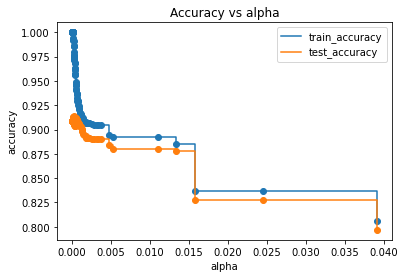

In [108]:
from sklearn.metrics import accuracy_score,confusion_matrix
dTreepostpruntrain_acc = []
dTreepostpruntest_acc = []
for c in dTrees:
    ytrain_pred = c.predict(x_train)
    ytest_pred = c.predict(x_test)
    dTreepostpruntrain_acc.append(accuracy_score(ytrain_pred,y_train))
    dTreepostpruntest_acc.append(accuracy_score(ytest_pred,y_test))

plt.scatter(ccp_alphas,dTreepostpruntrain_acc)
plt.scatter(ccp_alphas,dTreepostpruntest_acc)
plt.plot(ccp_alphas,dTreepostpruntrain_acc,label='train_accuracy',drawstyle="steps-post")
plt.plot(ccp_alphas,dTreepostpruntest_acc,label='test_accuracy',drawstyle="steps-post")
plt.legend()
plt.xlabel("alpha")
plt.ylabel("accuracy")
plt.title('Accuracy vs alpha')
plt.show()

In [195]:
## Decision Tree post pruning and prepruning :
dTreeopt1 = DecisionTreeClassifier(criterion = 'gini', random_state=1,max_depth=10,min_samples_split=15,min_samples_leaf=8,ccp_alpha=0.013)
dTreeopt1.fit(x_train, y_train)
print(dTreeopt1.score(x_train, y_train))
print(dTreeopt1.score(x_test, y_test))

0.884703196347032
0.8774733637747336


Confusion matrix, without normalization
[[1160  187]
 [ 135 1146]]
Normalized confusion matrix
[[0.86117298 0.13882702]
 [0.10538642 0.89461358]]


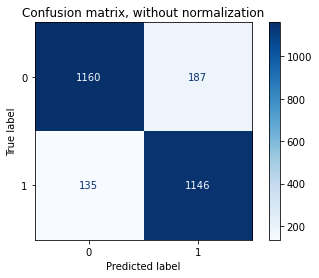

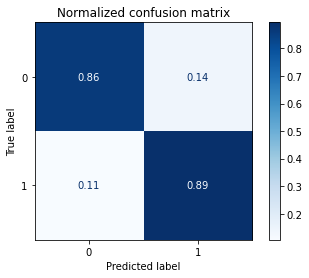

In [196]:
from sklearn.metrics import ConfusionMatrixDisplay
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        dTreeopt1,
        x_test,
        y_test,
        display_labels=class_names,
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

In [104]:
y_pred2 = dTreeopt1.predict(x_test) # This will give you positive class prediction probabilities  
dTreeopt1.score(x_test, y_pred2)
auc_roc=metrics.roc_auc_score(y_test,y_pred2)
auc_roc
from sklearn.metrics import roc_curve, auc
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred2)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

0.8806176967117492

Text(0.5, 0, 'False Positive Rate')

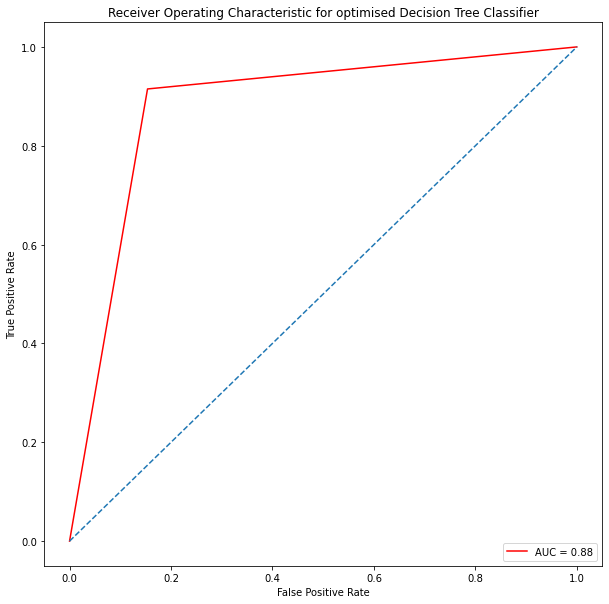

In [106]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
plt.title('Receiver Operating Characteristic for optimised Decision Tree Classifier')
plt.plot(false_positive_rate,true_positive_rate, color='red',label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],linestyle='--')
plt.axis('tight')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

## Part 4: Cross Validation:

In [174]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn import metrics
cvs=[2,5,10,15,20,25,30]
crossvalidationscores1=[]
crossvalidationerror1=[]
for i in range(len(cvs)):
    kfold = KFold(n_splits=cvs[i], random_state=42,shuffle=True)
    sgdmodel= SGDClassifier(alpha=0.001,max_iter=1000000,tol=1e-6,learning_rate='optimal',random_state=42,shuffle=True)
    scores = cross_val_score(sgdmodel, x, y, cv=kfold)
    crossvalidationscore1=np.mean(scores)*100.0
    crossvalidationscores1.append(crossvalidationscore1)
print(crossvalidationscores1)

[76.28995433789954, 72.89954337899543, 69.74885844748859, 68.71004566210046, 71.0958904109589, 68.4571102971103, 69.72602739726028]


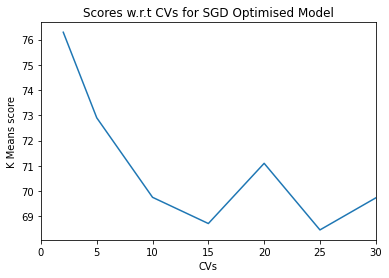

In [175]:
plt.plot(cvs,crossvalidationscores1)
plt.xlabel("CVs")
plt.ylabel("K Means score")
plt.title("Scores w.r.t CVs for SGD Optimised Model")
plt.xlim(0,30)
plt.show()

In [182]:
crossvalidationscores2=[]
for i in range(len(cvs)):
    kfold = KFold(n_splits=cvs[i], random_state=42,shuffle=True)
    model= SVC(gamma='auto',C=50.0,kernel='rbf',tol=0.001,random_state=42)
    results = cross_val_score(model, x, y, cv=kfold)
    crossvalidationscore2=np.mean(results)*100.0
    crossvalidationscores2.append(crossvalidationscore2)
print(crossvalidationscores2)

[73.91552511415524, 77.77397260273972, 78.3675799086758, 78.58447488584477, 78.73287671232876, 78.72061864061865, 78.71004566210044]


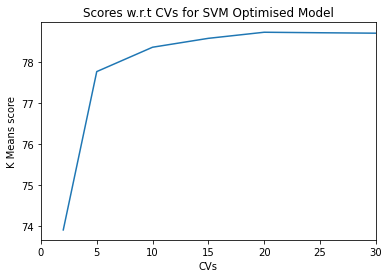

In [183]:
plt.plot(cvs,crossvalidationscores2)
plt.xlabel("CVs")
plt.ylabel("K Means score")
plt.title("Scores w.r.t CVs for SVM Optimised Model")
plt.xlim(0,30)
plt.show()

In [184]:
crossvalidationscores3=[]
for i in range(len(cvs)):
    kfold = KFold(n_splits=cvs[i], random_state=42,shuffle=True)
    dtmodel = DecisionTreeClassifier(criterion = 'gini', random_state=1,max_depth=10,min_samples_split=15,min_samples_leaf=8,ccp_alpha=0.01)
    scores = cross_val_score(dtmodel, x, y, cv=kfold)
    crossvalidationscore3=np.mean(scores)*100.0
    crossvalidationscores3.append(crossvalidationscore3)
print(crossvalidationscores3)

[87.81963470319634, 87.86529680365298, 88.07077625570777, 88.03652968036529, 88.04794520547945, 87.99169719169718, 88.09360730593608]


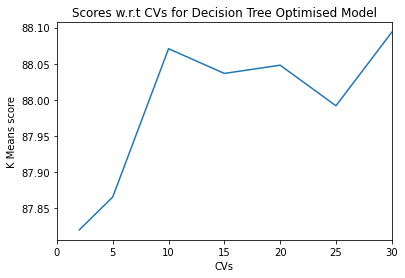

In [186]:
plt.plot(cvs,crossvalidationscores3)
plt.xlabel("CVs")
plt.ylabel("K Means score")
plt.title("Scores w.r.t CVs for Decision Tree Optimised Model")
plt.xlim(0,30)
plt.show()

## END OF THE ASSIGNMENT